# REPORT

Приготовления для вывода графиков:

In [2]:
# embeds plots drawed by matplotlib inside the Notebook
%matplotlib inline
%load_ext autoreload
%autoreload 2    
from os.path import join as join_path
import matplotlib.pylab as pylab
pylab.rcParams['figure.figsize'] = 16, 8  # Устанавливаем значение по умолчанию для размера изображения
import draw as dr # вспомогательный модуль для рисования графиков.
dr.plt.style.use('bmh')

def median_by_trial(paths, size=10): #вычисляет медиану пути для каждого из 10 графов
    return [dr.np.median(paths[10*i:(10*(i+1))],axis=0) for i in range(0, size)]  


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
results_dirs = '../results'

def get_data(file_in_results):
  file_path = join_path(results_dirs, file_in_results)
  return dr.get_json_data(file_path)

## Тор

Вероятность присутствия ребер генерировал по схеме: 25% - существуют всегда, остальные получают значение в соответствии с нормальным распределением. Граф по сути делал неориентированным.То есть ребра “туда” и “обратно” доступны или заблокированы всегда вместе. Это решает проблему того, что агент забредает в тупик из которого не сможет выбраться. В среднем путь между стартом и финишем существовал в 92% испытаний.

> <font color='red'>**Как выбирались конечная и начальная точки?**</font>

### 1. Тор(5x5): Медиана и длинны путей до цели

Испытания проводились на десяти случайных графах на каждом из которых было проведено 10 обучений агента.
Графики обрезаны длине пути до 200, чтобы было виднее что происходит с медианой. Пики длинны пути поднимаются порой до 1200 особенно в начале.

#### Результаты обучения отдельно на каждом из сгененрированных графов:

In [4]:
paths_5x5 = []
nets_5x5 = []
medians_5x5 = []
"""
Файл содержит в себе список елементами которого являются списки с результатами испытаний агента в среде в процессе обучения
paths_5x5[i] - список результатов испытаний в процессе i-того обучения
path_5x5[i][j] - длинна пути проейденного агентом до цели в j-ом испытании в i-ом процессе обучения.
"""

for i in xrange(1, 11):
    #old data: "output/RL_vs_FS/all_paths_{0}.json".format(i))
    paths_i = get_data("torus/5x5/stochasticenvironment/all_paths_{0}.json".format(i)) 
    #print "Graph #",i
    #dr.black_gray_plot(paths_i, dr.trials_median(paths_i), y_range=(0,150),x_range=(0,150))
    paths_5x5.extend(paths_i)
    medians_5x5.extend([dr.trials_median(paths_i)])
    nets_5x5.extend(get_data("torus/5x5/stochasticenvironment/all_secondary_{0}.json".format(i))) 

paths_5x5 = dr.np.array(paths_5x5)
nets_5x5 = dr.np.array(nets_5x5)
medians_5x5 = dr.np.array(medians_5x5)

#### Общий график для 100 обучений:

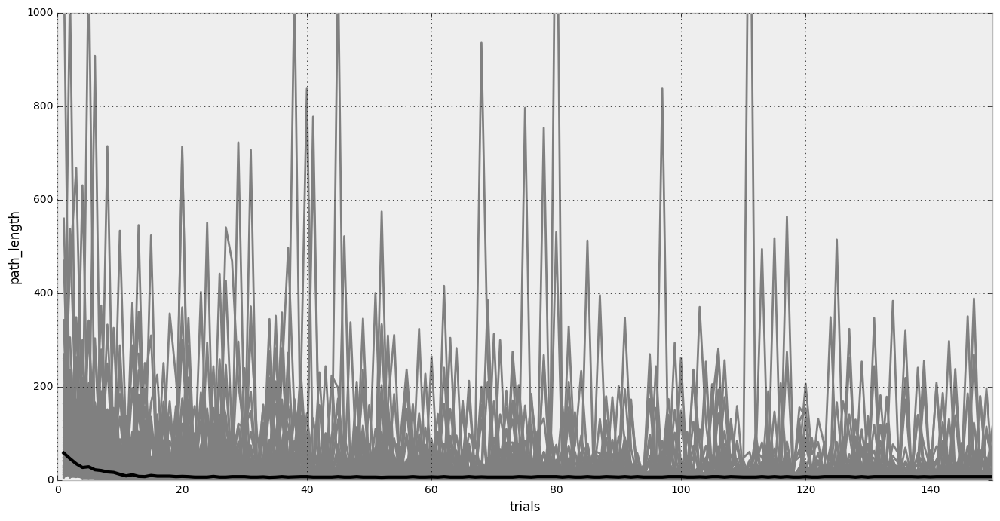

In [5]:
dr.black_gray_plot(paths_5x5, dr.trials_median(paths_5x5), 
                   y_range=(0, 1000), x_range=(0, 150))

#### Среднее и медиана по всем графам и всем обучениям

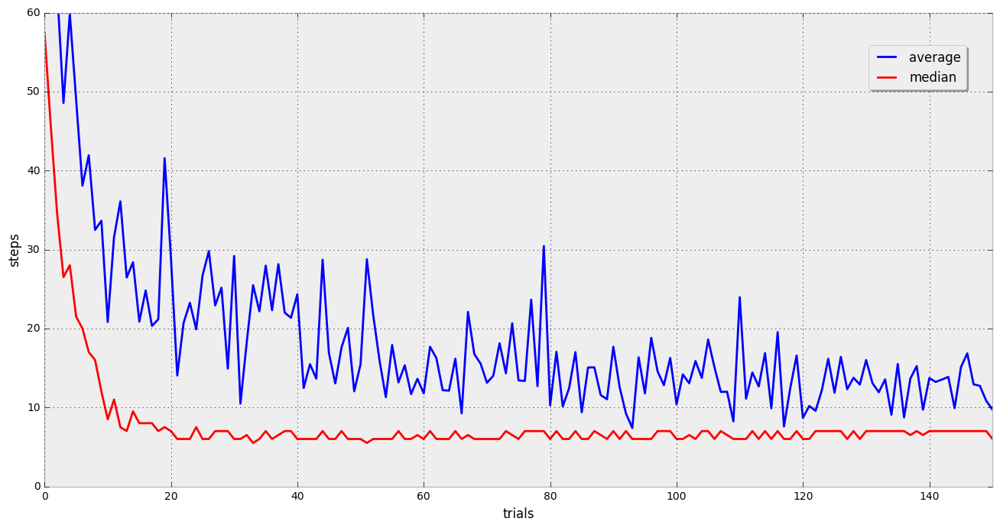

In [6]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111,xlabel='trials',ylabel='steps', 
                     xlim=[0,150], ylim=(0,60))
average, = ax.plot(dr.np.average(paths_5x5, axis=0), color='b')
median, = ax.plot(dr.np.median(paths_5x5, axis=0), color='r')
fig.legend(handles=[average,median], 
           labels=['average','median'], loc='upper center', 
           bbox_to_anchor=(0.75, 0.8), shadow=1)
dr.plt.show()

#### Общий график для медиан

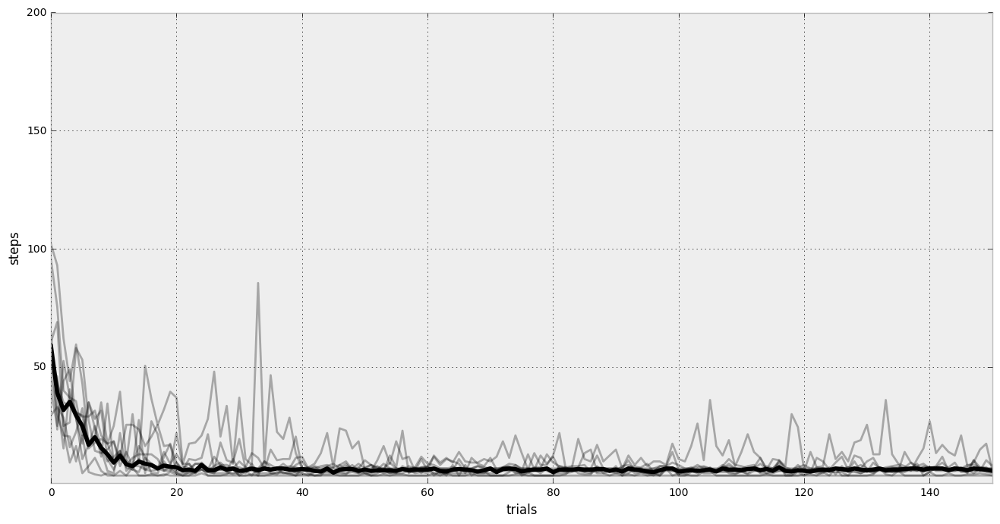

In [7]:
#dr.black_gray_plot(medians_5x5, dr.trials_median(medians_5x5),
#                   y_range=(0, 100), x_range=(0, 150))
fig = dr.plt.figure(1)
ax = fig.add_subplot(111,xlabel='trials',ylabel='steps', xlim=[0,150], ylim=[1,200])                     
ax.plot(dr.np.transpose(median_by_trial(paths_5x5)), color = 'black', alpha=0.3, lw = 2)
ax.plot((dr.np.median(median_by_trial(paths_5x5), axis=0)), color = 'black', lw = 4)
dr.plt.show()

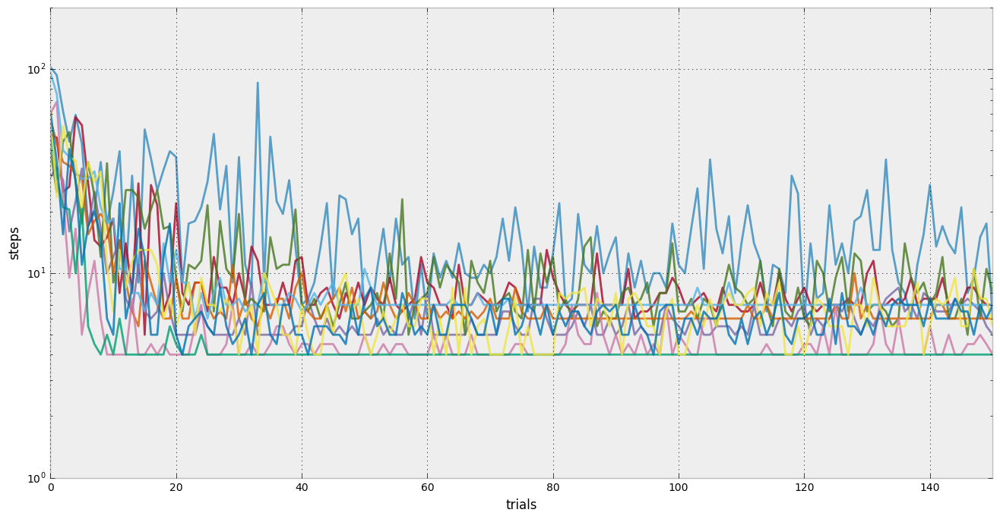

In [8]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111,xlabel='trials',ylabel='steps', 
                     xlim=[0,150], ylim=[1,200])
ax.semilogy(dr.np.transpose(median_by_trial(paths_5x5)),
            alpha=0.8)
dr.plt.show()

### 2. Тор(5x5): Графики для визуализации связи сложности среды с числом ФС

#### 2.1. Корреляция сложности среды с числом ФС после обучения

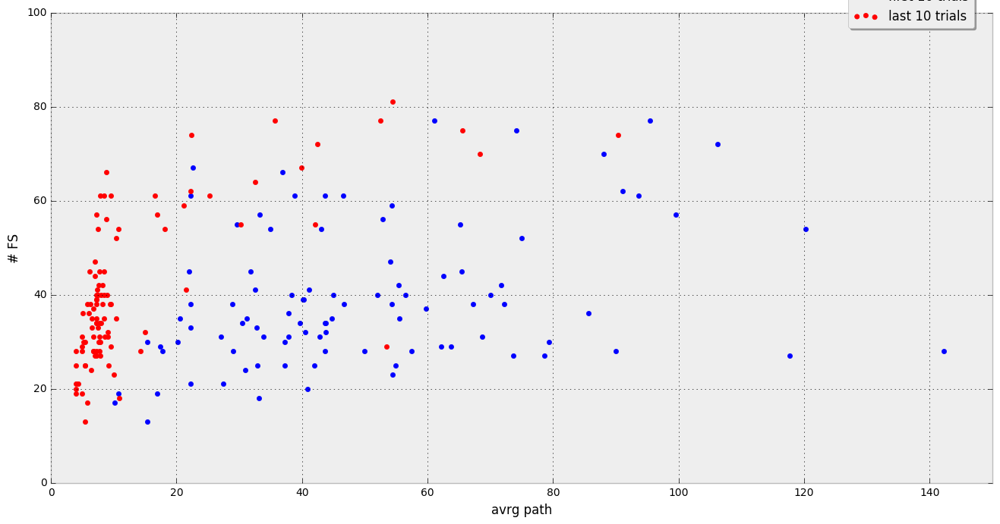

In [9]:
paths_first = dr.np.average(paths_5x5[:,:10], axis=1)
paths_last = dr.np.average(paths_5x5[:,-10:], axis=1)
nets_5x5_total = dr.np.average(nets_5x5[:,-1:], axis=1)
fig = dr.plt.figure(1)
ax = fig.add_subplot(111,xlabel='avrg path',ylabel='# FS', 
                     xlim=[0,150], ylim=[0,100])
first = ax.scatter(paths_first, nets_5x5_total, color='b')
last = ax.scatter(paths_last, nets_5x5_total, color='r')
fig.legend((first,last),('first 10 trials', 'last 10 trials'), 
           loc='upper center', bbox_to_anchor=(0.75, 0.9), 
           shadow=1)
dr.plt.show()

#### 2.2 Изменение эфективности поведения в процессе обучения ("среднее число переходов до цели за первые 20 попыток в среде", «среднее число переходов до цели за последние 20 попыток в среде»)

5.82676568845


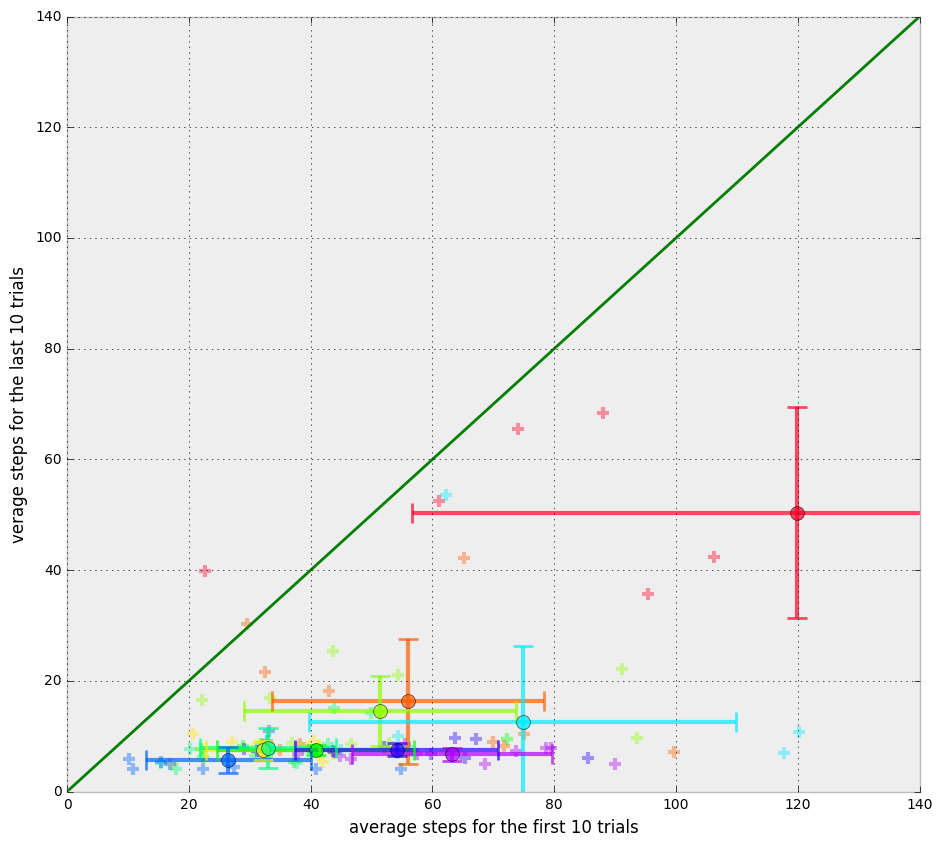

In [10]:
rel_eff_FS_5x5 = dr.np.divide(dr.np.average(paths_5x5[:,:10], axis=1),dr.np.average(paths_5x5[:,-10:], axis=1))
print dr.np.average(rel_eff_FS_5x5)

fig = dr.plt.figure(1, figsize=[11,10])
sc = fig.add_subplot(111,xlabel='average steps for the first 10 trials',xlim=[0,140],
                    ylabel='verage steps for the last 10 trials',ylim=[0,140])
for i in range(0, 10):
    sc.scatter(paths_first[i*10:(i+1)*10],                           
               paths_last[i*10:(i+1)*10],
               s=80, alpha = 0.4, marker = '+', lw= 3,            
               color=dr.plt.cm.gist_rainbow(int(i*25.5)))
    sc.errorbar(dr.np.average(paths_first[i*10:(i+1)*10]),                           
               dr.np.average(paths_last[i*10:(i+1)*10]),
               xerr=dr.np.std(paths_first[i*10:(i+1)*10]),
               yerr=dr.np.std(paths_last[i*10:(i+1)*10]),
               alpha = 0.7, elinewidth = 3, 
               marker = 'o', ms = 10,
               capsize = 7, capthick = 2,             
               color=dr.plt.cm.gist_rainbow(int(i*25.5)))
sc.plot(dr.np.linspace(0,250),dr.np.linspace(0,250),'g')
""" hst = fig.add_subplot(122,xlabel='steps',ylabel='# runs', xlim=[0,180], ylim=[0,180])
for i in range(0, 10):
    hst.errorbar(dr.np.average(paths_first[i*10:(i+1)*10]),                           
               dr.np.average(paths_last[i*10:(i+1)*10]),
               xerr=dr.np.std(paths_first[i*10:(i+1)*10]),
               yerr=dr.np.std(paths_last[i*10:(i+1)*10]),
               alpha = 0.5, elinewidth = 3, 
               marker = 'o', ms = 10,
               capsize = 7, capthick = 2,             
               color=dr.plt.cm.gist_rainbow(int(i*25.5)))
#hst.hist(paths_last, bins=25, histtype="stepfilled", alpha=0.7)
#hst.hist(paths_last) """
dr.plt.show()

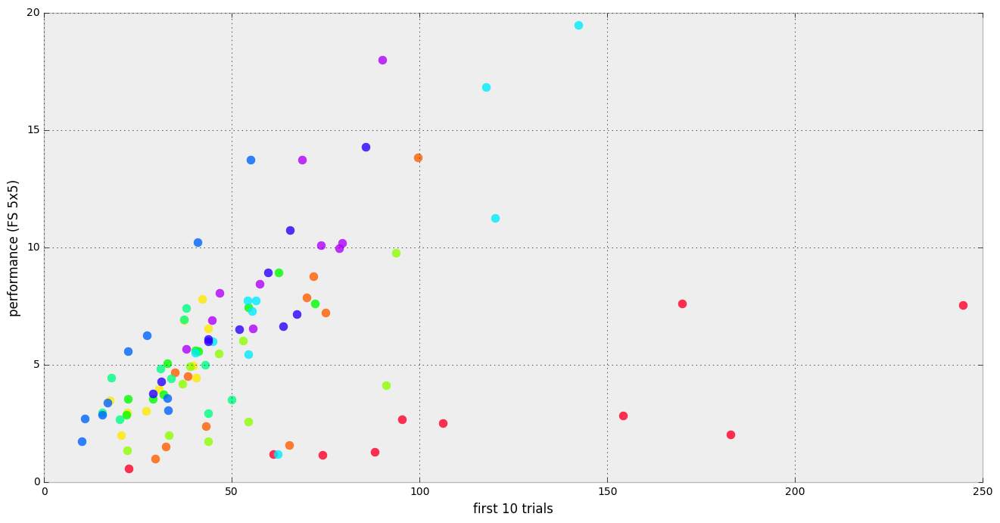

In [11]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111, xlabel="first 10 trials",
                     xlim=[0,250], ylim=[0,20],
                     ylabel="performance (FS 5x5)",)
for i in range(0, 10):
    ax.scatter(paths_first[i*10:(i+1)*10],
               rel_eff_FS_5x5[i*10:(i+1)*10],
               s=60,alpha = 0.8,
               color=dr.plt.cm.gist_rainbow(int(i*25.5)))
dr.plt.show()

#### Средняя эффективность обучения (отношения средней длины пути на первых 10 попытках к длине пути на последних 10)

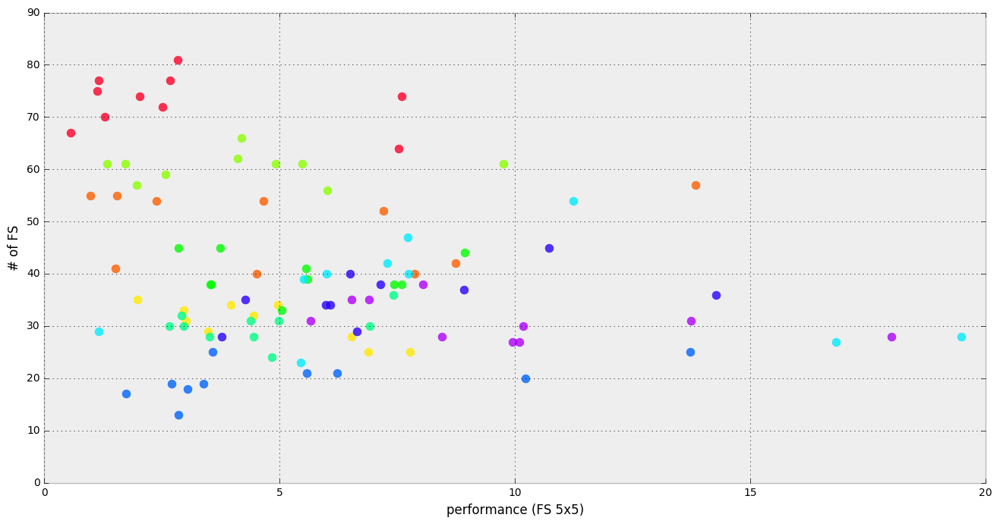

0.17181463198


In [12]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111, xlabel="performance (FS 5x5)",
                     ylabel="# of FS", xlim=[0,20])
for i in range(0, 10):
    ax.scatter(rel_eff_FS_5x5[i*10:(i+1)*10],
               nets_5x5_total[i*10:(i+1)*10], s=60, 
               alpha = 0.8,
               color=dr.plt.cm.gist_rainbow(int(i*25.5)))
dr.plt.show()
print dr.np.average(dr.np.divide(rel_eff_FS_5x5,
                                 nets_5x5[:,-1]))

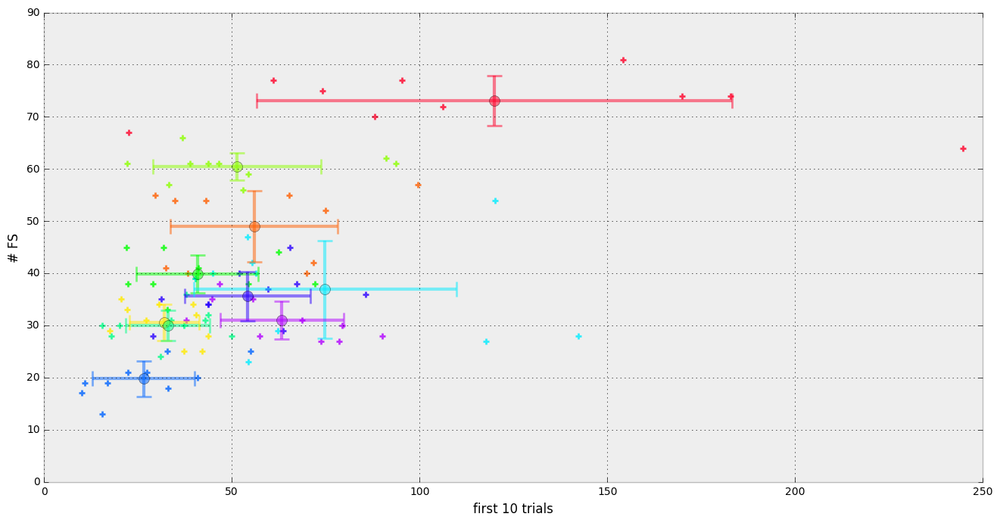

In [13]:

fig = dr.plt.figure(1)
ax = fig.add_subplot(111, xlabel="first 10 trials",
                     ylabel="# FS", xlim=[0,250])
for i in range(0, 10):
    ax.scatter(paths_first[i*10:(i+1)*10],
               nets_5x5_total[i*10:(i+1)*10],
               s=40, lw= 2, alpha = 0.8, marker = '+',
               color=dr.plt.cm.gist_rainbow(int(i*25.5)))
    ax.errorbar(dr.np.average(paths_first[i*10:(i+1)*10]),
               dr.np.average(nets_5x5_total[i*10:(i+1)*10]),
               xerr=dr.np.std(paths_first[i*10:(i+1)*10]),
               yerr=dr.np.std(nets_5x5_total[i*10:(i+1)*10]),
               alpha = 0.5, elinewidth = 3, 
               marker = 'o', ms = 10,
               capsize = 7, capthick = 2,
               color=dr.plt.cm.gist_rainbow(int(i*25.5)))
dr.plt.show()

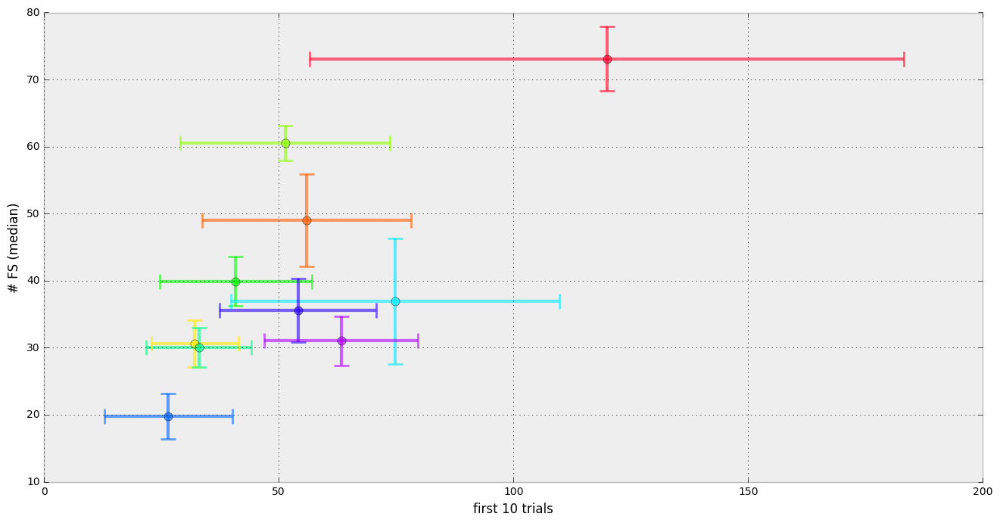

2.06721311475


In [14]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111, xlabel="first 10 trials",
                     ylabel="# FS (median)", xlim=[0,200])
for i in range(0, 10):
    ax.errorbar(dr.np.average(paths_first[i*10:(i+1)*10]),
               dr.np.average(nets_5x5_total[i*10:(i+1)*10]),
               xerr=dr.np.std(paths_first[i*10:(i+1)*10]),
               yerr=dr.np.std(nets_5x5_total[i*10:(i+1)*10]),
               alpha = 0.6, elinewidth = 3,
               marker = 'o', ms = 8, capsize = 7, capthick = 2,
               color=dr.plt.cm.gist_rainbow(int(i*25.5)))
dr.plt.show()
print dr.np.average(dr.np.divide(dr.np.median(dr.np.average(paths_5x5[i*10:(i+1)*10,:10], axis=1)),
                                 dr.np.median(nets_5x5[i*10:(i+1)*10,-1:])))

### 3. Тор(5x5): Среднее число элементов во вторичной функциональной сети

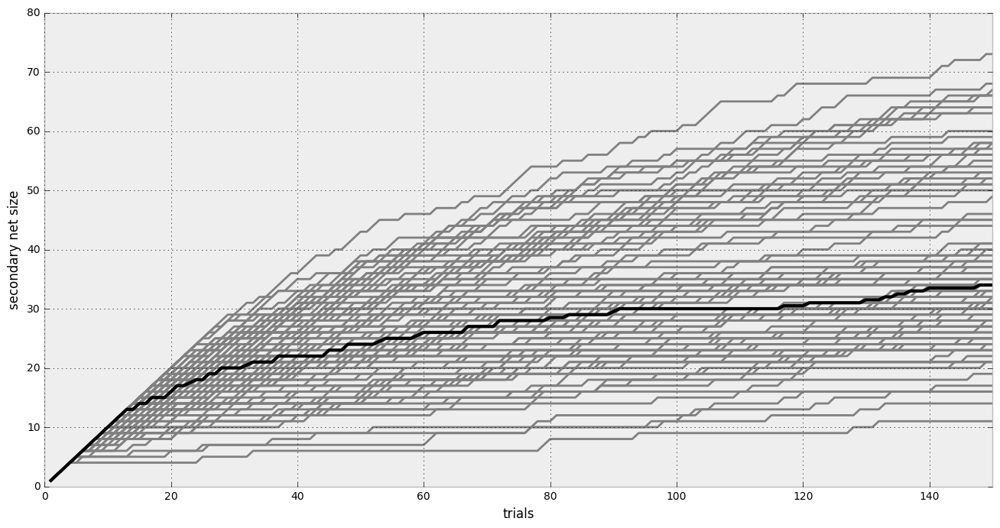

In [15]:
dr.black_gray_plot(nets_5x5, 
                   dr.np.median(dr.np.array(nets_5x5), axis=0),
                   y_label="secondary net size", 
                   y_range=(0,80), x_range=(0,150))

#### Динамика среднего числа ФС для каждой из 10-ти сред

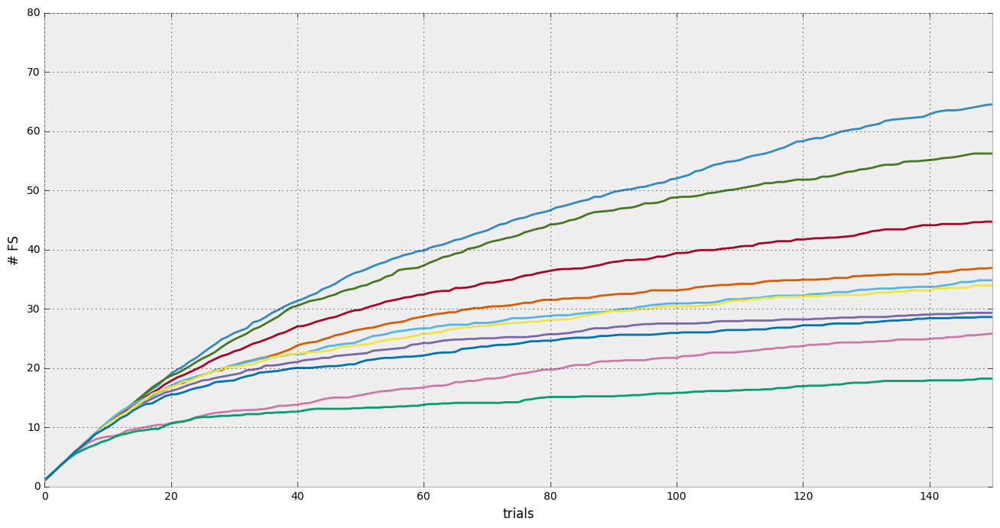

In [16]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111,xlabel='trials',ylabel='# FS', 
                     ylim=[0,80], xlim=[0,150])
ax.plot(dr.np.transpose(
                        [dr.np.average(nets_5x5[10*i:(10*(i+1))],
                                       axis=0) 
                         for i in range(0, 10)]))
dr.plt.show()

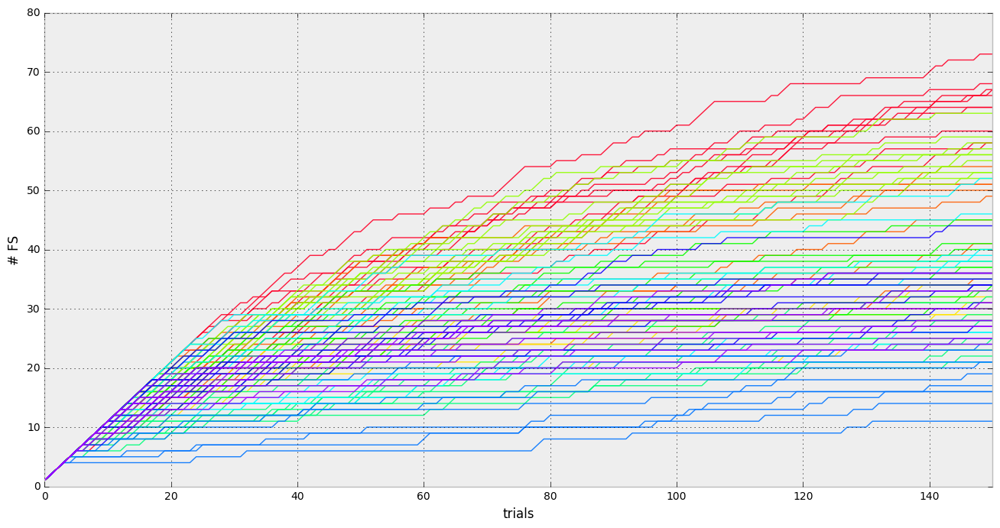

In [17]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111, xlabel='trials', xlim=[0,150], 
                     ylabel='# FS', ylim=[0,80])
for i in range(0, 10):
    ax.plot(dr.np.transpose(nets_5x5[10*i:(10*(i+1))]),
            color=dr.plt.cm.gist_rainbow(int(i*25),alpha=0.9), 
            lw=1)             
dr.plt.show()

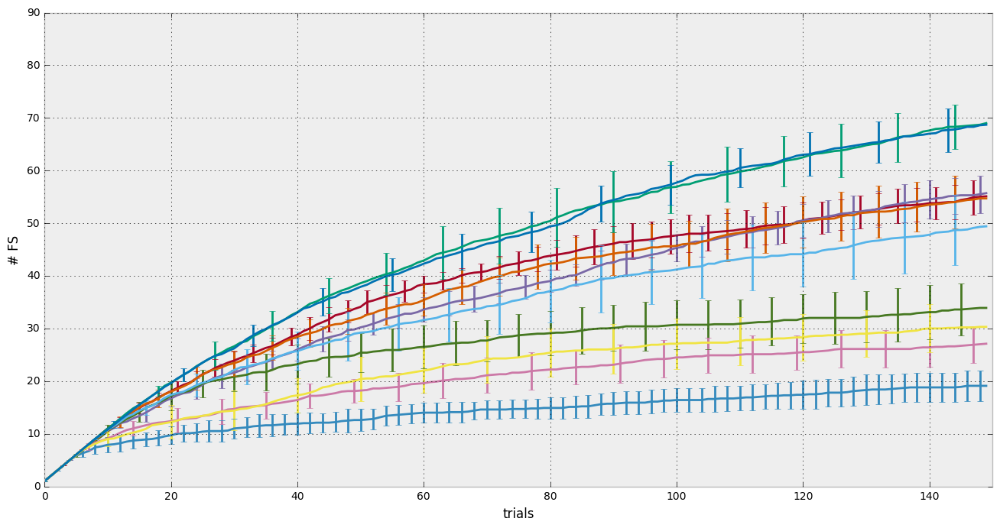

In [18]:
nets_5x5_old = [] #почему-то не падает с ошибкой на новых данных. загрузил старые
for i in xrange(1, 11):
    #old data: "output/RL_vs_FS/all_paths_{0}.json".format(i))
    nets_5x5_old.extend(get_data("RL_vs_FS/all_secondary_{0}.json".format(i))) 

fig = dr.plt.figure(1)
ax = fig.add_subplot(111,xlabel='trials',ylabel='# FS', 
                     ylim=[0,90], xlim=[0,150])

for i in range(0, 10):
    ax.errorbar(dr.np.arange(150),
            dr.np.transpose(dr.np.average(nets_5x5_old[10*i:(10*(i+1))], axis=0)),
            yerr = dr.np.transpose(dr.np.std(nets_5x5_old[10*i:(10*(i+1))], axis=0)), errorevery=2+i)
dr.plt.show()

### 4.Тор(5x5): Обучение до насыщения. 

Изначально я считал что насыщение достигнуто, когда агент на протяжении 50 испытаний тодряд не
добавлял новые функциональные системы(то есть весь путь проходил по выученной траектории).
Я провел сумарно 25 тестовых испытаний на 5 случайных графах.
Среднее время наступления этого состояния:  314.68 испытаний
Максимальное было между 800 и 850.
После я повторил 25 обучений, каждое из которых длилось ровно 800 испытаний. Следующие графики показывают результаты этих обучений.

In [19]:
#Сначала загрузим данные:
sat_paths = []
sat_nets = []
for i in xrange(1,6):
    sat_paths.extend(get_data("5x5saturation_800/all_paths_{0}.json".format(i)))
    sat_nets.extend(get_data("5x5saturation_800/all_secondary_{0}.json".format(i)))
sat_paths = dr.np.array(sat_paths)
sat_nets = dr.np.array(sat_nets)

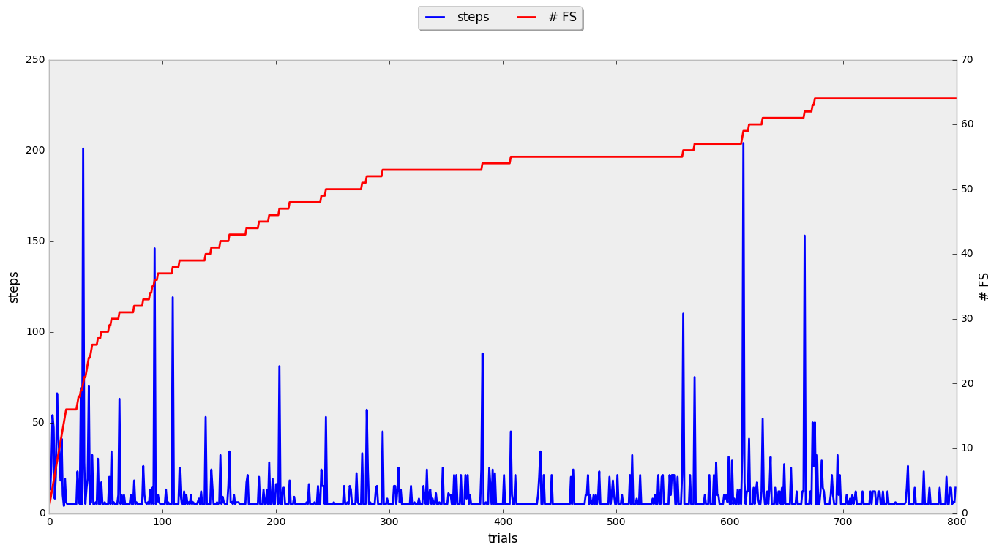

In [20]:
run = 20
fig = dr.plt.figure(1)
ax = fig.add_subplot(111, xlabel="trials", ylabel="steps")
ax.grid(0)
pt, = ax.plot(sat_paths[run],  '-b')
ax2 = ax.twinx()
fs, = ax2.plot(sat_nets[run],  '-r')
ax2.set_ylabel('# FS')
ax2.grid(0)
fig.legend(handles=[pt,fs], labels=['steps','# FS'], ncol=2,
           loc='upper center', #bbox_to_anchor=(0.8, 0.85), 
           shadow=1)
dr.plt.show()

#### 4.1 Размер сети вторичных ФС. Медиана:

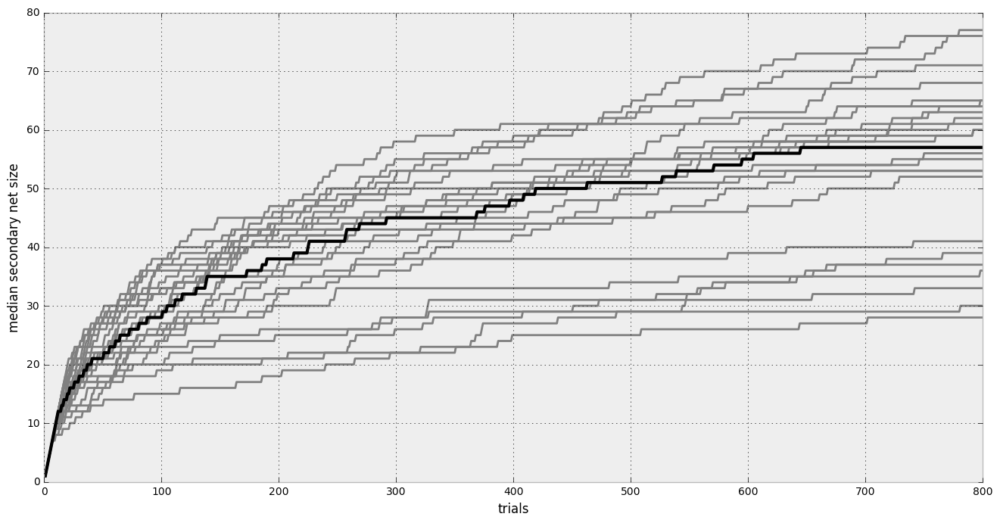

In [21]:
dr.black_gray_plot(sat_nets, dr.trials_median(sat_nets),
                        y_label="median secondary net size", 
                        y_range=(0,80))

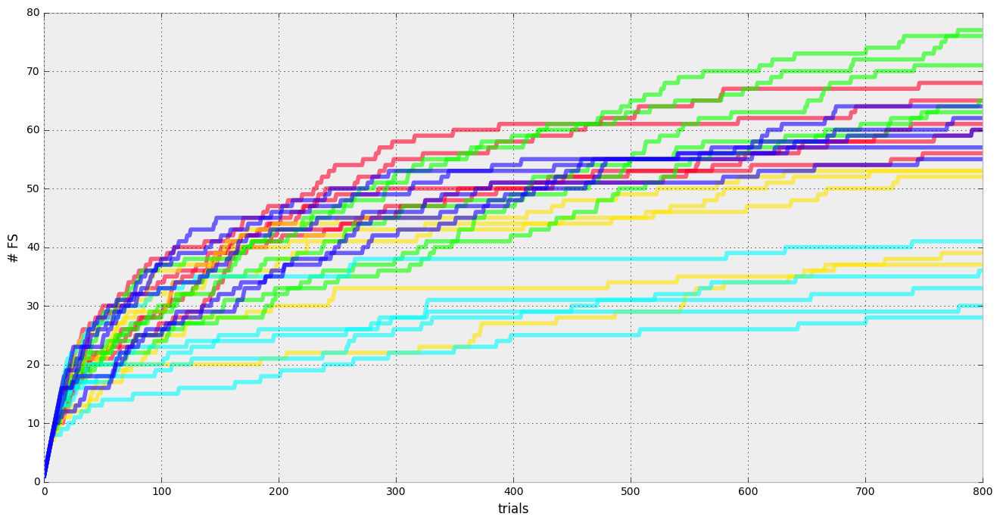

In [22]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111,xlabel='trials',ylabel='# FS', 
                     ylim=[0,80])
for i in range(0, 5):
    ax.plot(dr.np.transpose(sat_nets[5*i:5*(i+1)]), lw=4,
            color=dr.plt.cm.gist_rainbow(int(i*50),alpha=0.6))
dr.plt.show()

#### 4.2 Размер сети вторичных ФС. Среднее:

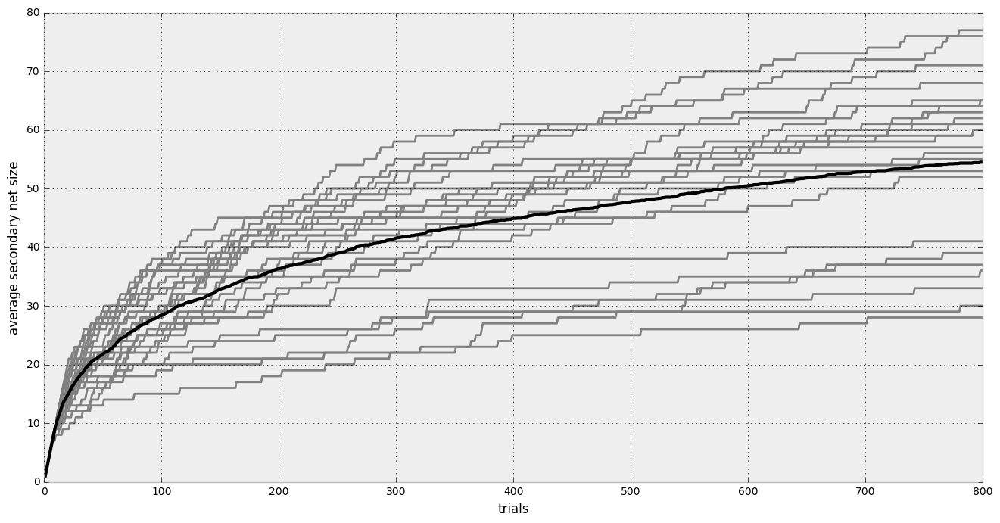

In [23]:
dr.black_gray_plot(sat_nets, 
                   dr.np.average(dr.np.array(sat_nets), axis=0),
                        y_label="average secondary net size", 
                        y_range=(0,80))

#### 4.3 Длинна пути. Медиана:

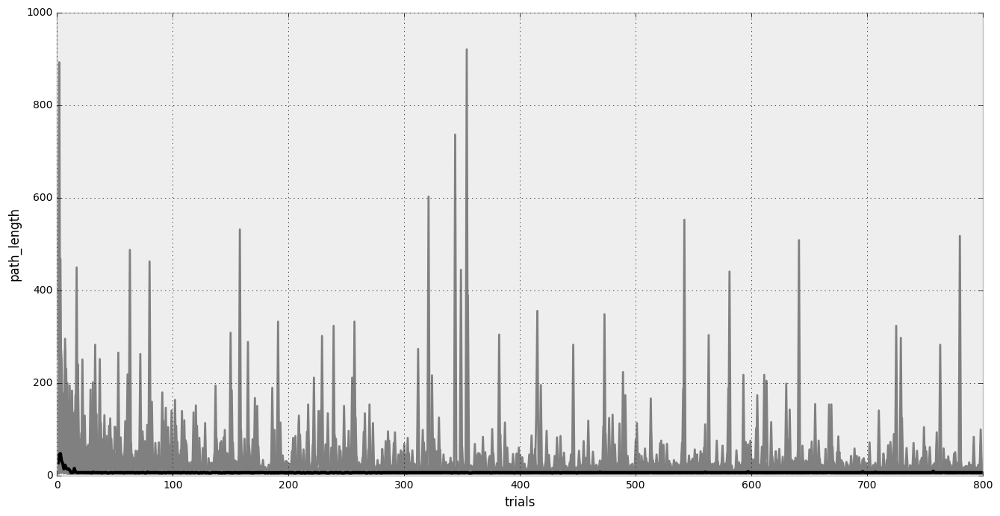

In [24]:
dr.black_gray_plot(sat_paths, dr.trials_median(sat_paths))

#### 4.4. Длинна пути. Медиана. Приближение:

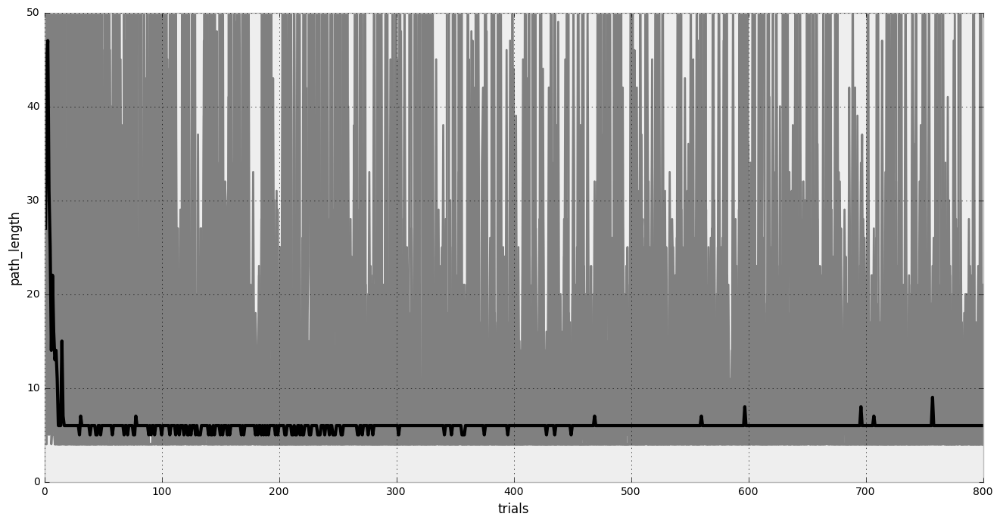

In [25]:
dr.black_gray_plot(sat_paths, dr.trials_median(sat_paths), y_range=(0,50))

#### 4.5. Средняя эффективность обучения (отношения средней длины пути на первых 10 попытках к длине пути на последних 10)

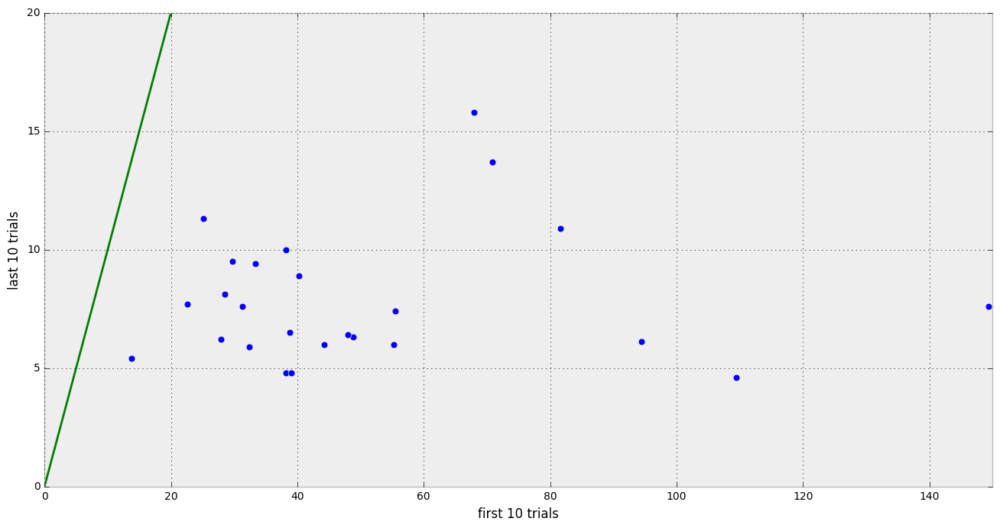

In [26]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111,xlabel='first 10 trials',
                     ylabel='last 10 trials', xlim=[0,150], 
                     ylim=[0,20])
ax.scatter(dr.np.average(sat_paths[:,:10], axis=1),
           dr.np.average(sat_paths[:,-10:], axis=1),s=40)
ax.plot(dr.np.linspace(0,150),dr.np.linspace(0,150),'g')
dr.plt.show()

In [27]:
rel_eff_FS_5x5_800 = dr.np.divide(dr.np.average(sat_paths[:,:10], axis=1),dr.np.average(sat_paths[:,-10:], axis=1))
print dr.np.average(rel_eff_FS_5x5_800)

7.10707132178


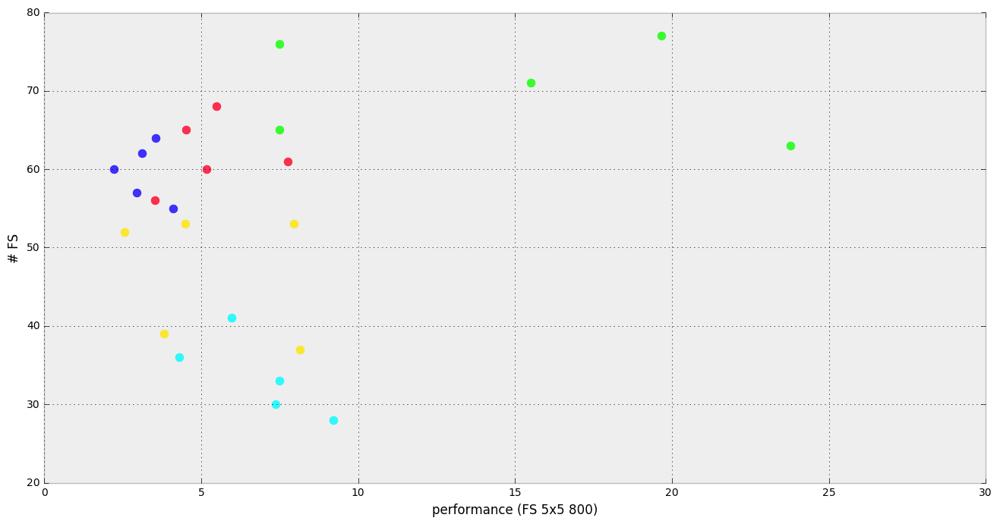

0.137210582073


In [28]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111, xlabel="performance (FS 5x5 800)",
                     ylabel="# FS", xlim=[0,30])
for i in range(0, 5):
    ax.scatter(rel_eff_FS_5x5_800[i*5:(i+1)*5],
               sat_nets[i*5:(i+1)*5,-1:], s=60, 
               alpha = 0.8,
               color=dr.plt.cm.gist_rainbow(int(i*50)))
dr.plt.show()
print dr.np.average(dr.np.divide(rel_eff_FS_5x5_800,
                                 sat_nets[:,-1]))

### 5. Тор(5x5): Обучение с подкреплением

Испытания автоматически останавливались после 4000 действий.

In [29]:
# загрузим версию Версию q-learning alpha=0.1 gamma = 0.9, epsilon = 0.01 
# тк она была среди самых эффективных в сравнении различных параметров для Sarsa и Q-learning в торе 10x10

rl_paths_5x5 = [] 
for i in xrange(1, 11):
    # old data: "output/RL_vs_FS/RL_all_paths_{0}.json"
    rl_paths_5x5.extend(get_data(
        "torus/5x5/stochasticenvironment/q-learning_(0.1,0.9, 0.01)_{0}.json".format(i)))
# первым аргументом идет пустой список тк графики отдельных обучений накладываясь создают почти монотонный серый фон.    
rl_paths_5x5 = dr.np.array(rl_paths_5x5)

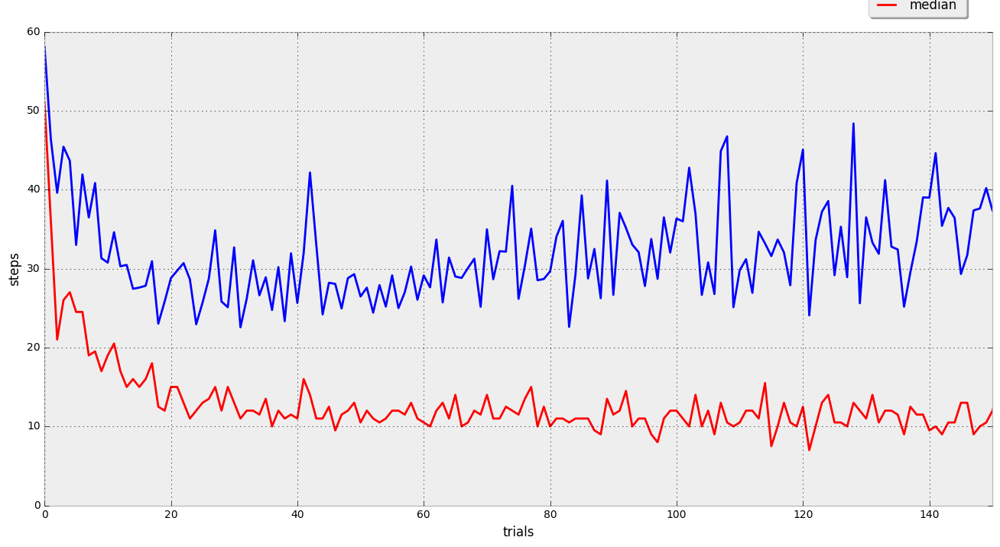

In [30]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111, xlabel='trials',ylabel='steps', 
                     xlim=[0,150])
average, = ax.plot(dr.np.average(rl_paths_5x5, axis=0), 
                   color='b')
median, = ax.plot(dr.np.median(rl_paths_5x5, axis=0), 
                  color='r')
fig.legend(handles=[average,median], 
           labels=['average','median'], 
           loc='upper center', bbox_to_anchor=(0.75, 0.95), 
           shadow=1)
dr.plt.show()

#### Медианы для каждой среды по отдельности

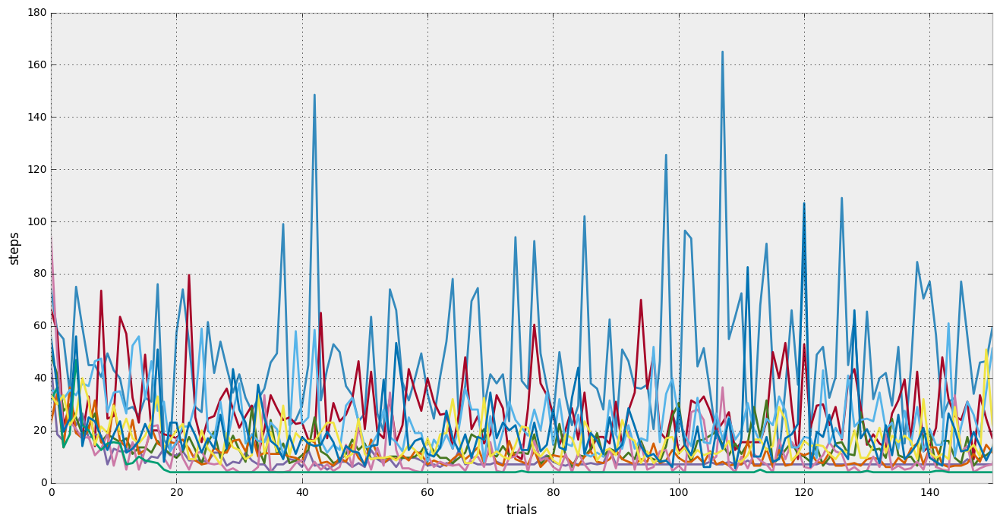

In [31]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111, xlabel='trials', 
                     ylabel='steps', xlim=[0,150])
for i in range(0, 10):
    ax.plot(dr.np.transpose(dr.np.median(rl_paths_5x5[10*i:(10*(i+1))], axis=0)))
dr.plt.show()


#### Изменение эфективности RL в процессе обучения ("среднее число переходов до цели за первые 10 попыток в среде", «среднее число переходов до цели за последние 10 попыток в среде»)

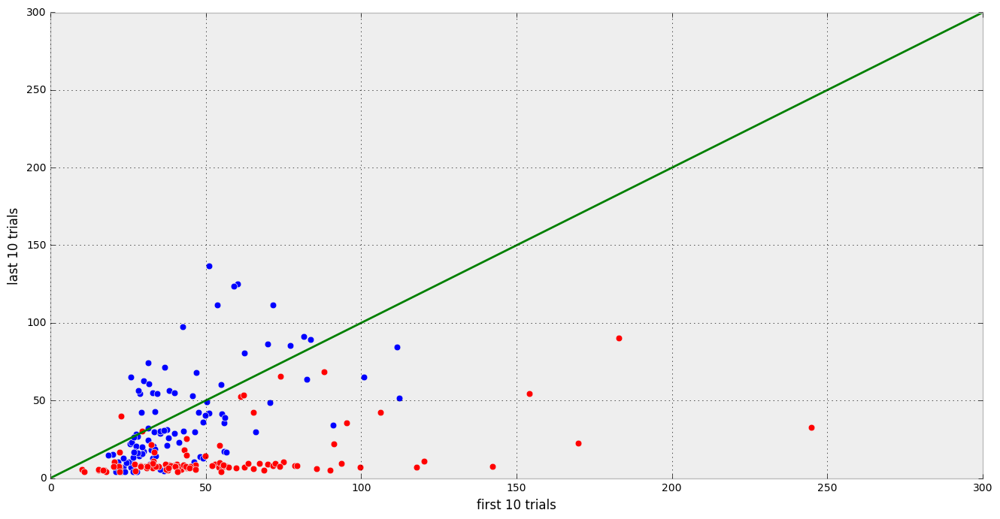

In [32]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111, xlabel='first 10 trials', 
                     ylabel='last 10 trials', 
                     xlim=[0,300], ylim=[0,300])
rl = ax.scatter(dr.np.average(rl_paths_5x5[:,:10], axis=1),
                dr.np.average(rl_paths_5x5[:,-10:], axis=1),
                c='b',s=40)
fs = ax.scatter(dr.np.average(paths_5x5[:,:10], axis=1),
                dr.np.average(paths_5x5[:,-10:], axis=1), 
                c='r', s=40)
ax.plot(dr.np.linspace(0,300),dr.np.linspace(0,300),'g')
dr.plt.show()

In [33]:
rel_eff_RL_5x5 = dr.np.divide(dr.np.average(rl_paths_5x5[:,:10], axis=1),dr.np.average(rl_paths_5x5[:,-10:], axis=1))
print dr.np.average(rel_eff_RL_5x5)

1.89163449369


### <a id='article_6'></a> 6.Сравнение стохастического алгоритма обучения ФС с  Reinforcement Learning на одних и тех же графах.

####  6.1 Корреляция.

Координаты: (среднее число шагов за последние 20 попыток для медианы в случае нашего алгоритма, тоже самое для RL).

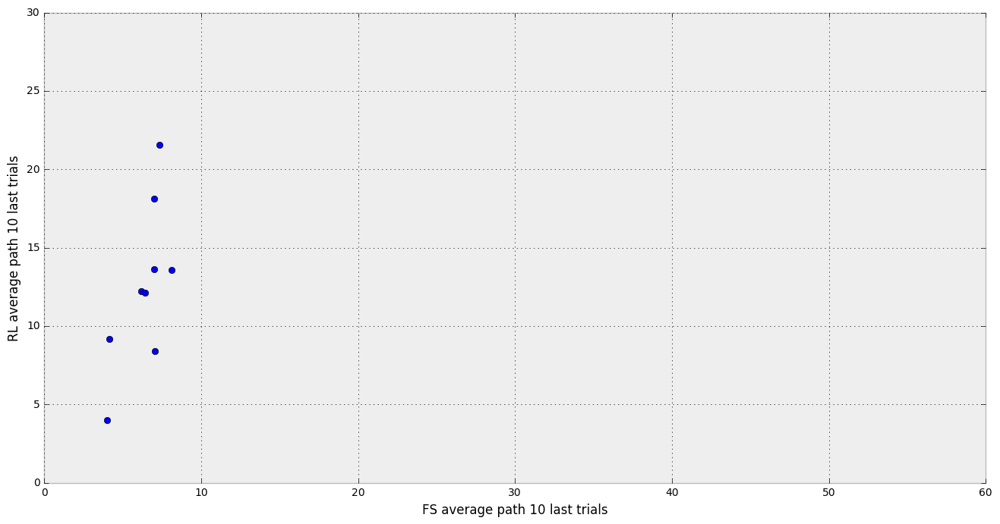

In [34]:
#сначала посчитаем медианы для обучений на каждом из графов 
# (в списках они будут идти по порядку)
fs_medians = []
rl_medians = []
for i in xrange(0, 100, 10): 
    # на каждом графе проводилось по 10 обучений
    fs_medians.append(dr.trials_median(paths_5x5[i:i+10,:]))
    rl_medians.append(dr.trials_median(rl_paths_5x5[i:i+10,:]))
fs_medians = dr.np.array(fs_medians)
rl_medians = dr.np.array(rl_medians)
dr.average_values_correlation(fs_medians[:,-10:], 
                              rl_medians[:,-10:],
                              x_range=(0,60),
                              y_range=(0,30),
                              x_label=
                              "FS average path 10 last trials",
                              y_label="RL average path 10 last trials")

#### Относительная средняя эффективность ФС к RL на торе 5х5

In [35]:
print dr.np.divide(dr.np.average(rl_medians[:,-10:], axis=1), dr.np.average(fs_medians[:,-10:], axis=1))
print dr.np.average(dr.np.divide(dr.np.average(rl_medians[:,-20:], axis=1), dr.np.average(fs_medians[:,-20:], axis=1)))

[ 3.12756264  2.93197279  1.19148936  1.67283951  1.96774194  2.20481928
  2.58571429  1.          1.94285714  1.890625  ]
2.24591850756


#### 6.2 Сравнение средней длинны пути для медиан. 

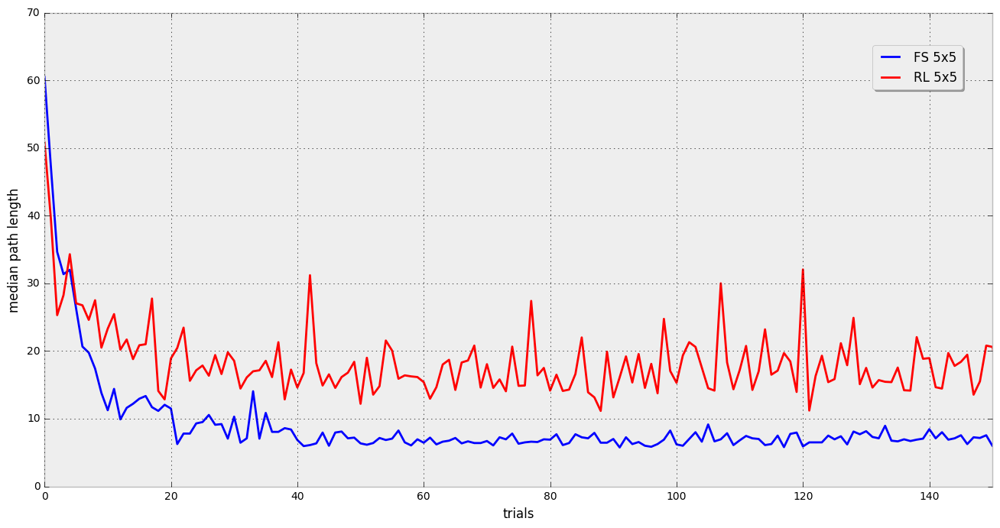

In [36]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111, xlim=[0,150], xlabel="trials", 
                     ylabel="median path length")
fs, = ax.plot(dr.np.average(fs_medians, axis=0),  '-b')
rl, = ax.plot(dr.np.average(rl_medians, axis=0),  '-r')
fig.legend(handles=[fs,rl], labels=['FS 5x5','RL 5x5'], 
           loc='upper center', bbox_to_anchor=(0.75, 0.8), 
           shadow=1)
dr.plt.show()

### 7. Тор(10x10): графики для всех обучений и их медиана

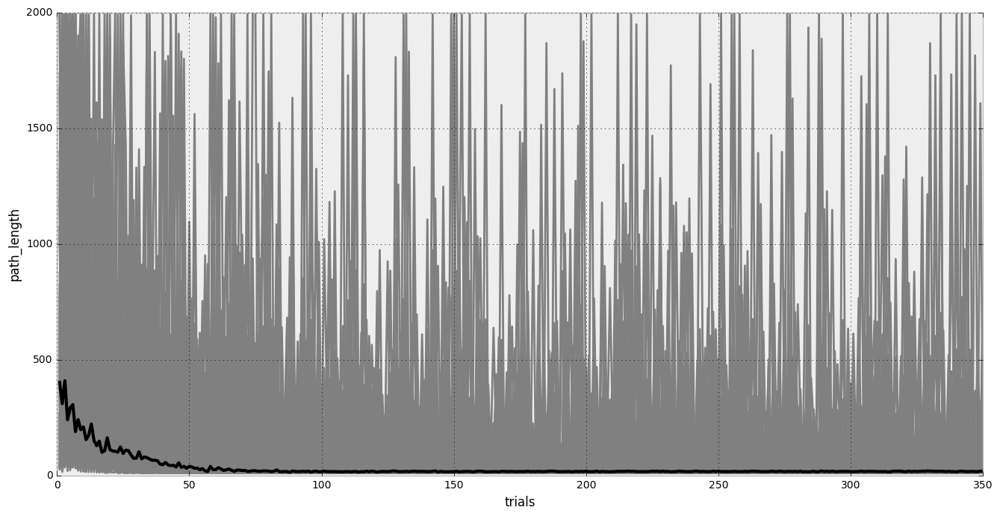

In [37]:
paths_10x10 = []
nets_10x10 = []
for i in xrange(1, 11):
    #old data: "output/10x10torus250/all_paths_{0}.json".format(i)))
    paths_10x10.extend(get_data("torus/10x10_other/stochasticenvironment/all_paths_{0}.json".format(i)))
    #old data: "output/10x10torus250/all_secondary_{0}.json".format(i)))
    nets_10x10.extend(get_data("torus/10x10_other/stochasticenvironment/all_secondary_{0}.json".format(i)))
paths_10x10 = dr.np.clip(dr.np.array(paths_10x10),0,2000)
nets_10x10 = dr.np.array(nets_10x10)
dr.black_gray_plot(paths_10x10, 
                   dr.trials_median(paths_10x10))    

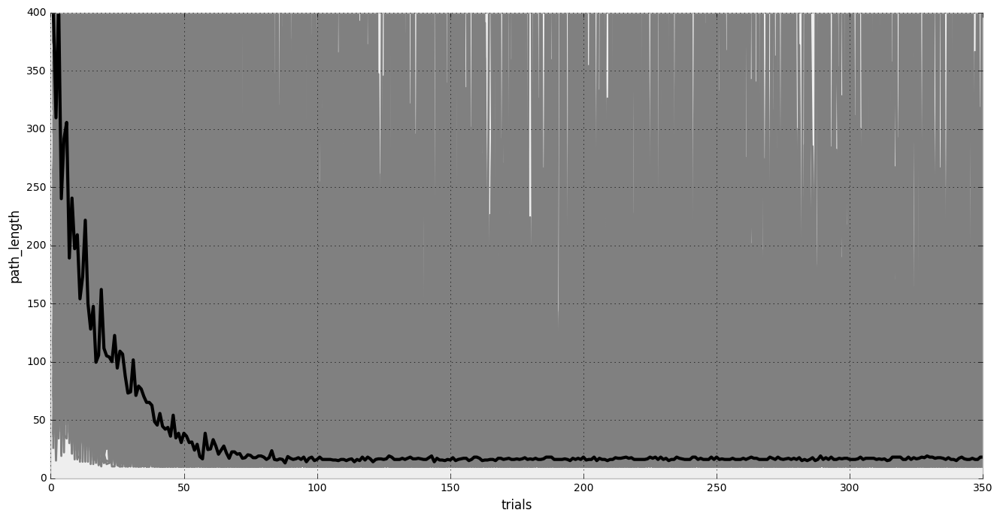

In [38]:
# Приближение по оси Y
dr.black_gray_plot(paths_10x10, dr.trials_median(paths_10x10), 
                   y_range=(0,400))

#### 7.1 Тор(10x10): Рост сети вторичных функциональных систем

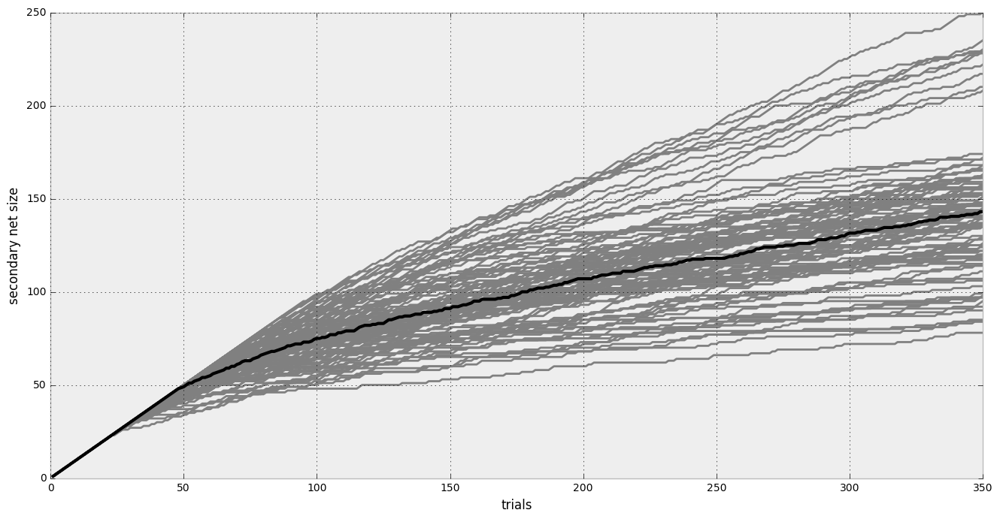

In [39]:
dr.black_gray_plot(nets_10x10, dr.trials_median(nets_10x10),
                        y_label="secondary net size")

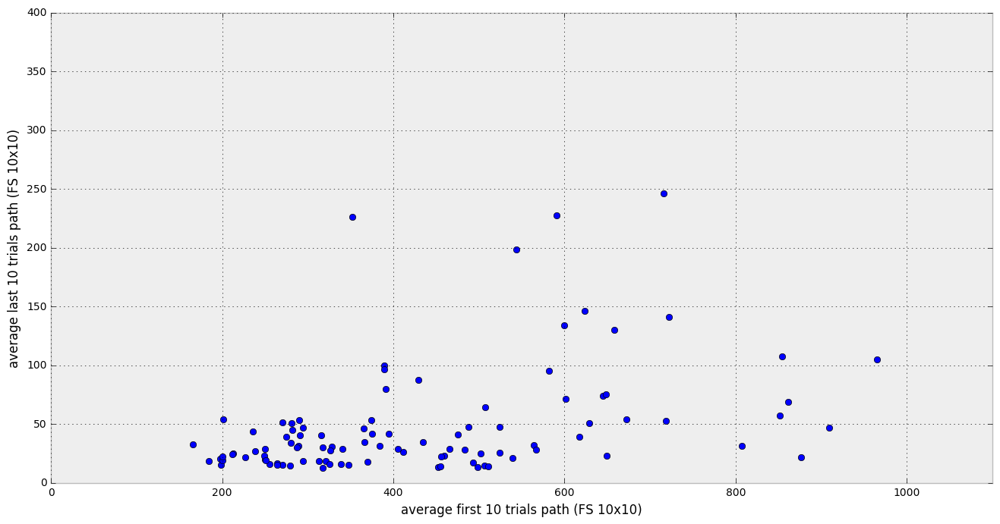

In [40]:
 dr.average_values_correlation(paths_10x10[:,:10], 
                               paths_10x10[:,-10:],
                              x_range=(0,1100), 
                              y_range=(0,400),
                              x_label=
                              "average first 10 trials path (FS 10x10)", 
                              y_label=                              
                              "average last 10 trials path (FS 10x10)")

#### 7.2. Средняя эффективность обучения (отношения средней длины пути на первых 10 попытках к длине пути на последних 10)

In [41]:
paths_first_10x10 = dr.np.average(paths_10x10[:,:10], axis=1)
paths_last_10x10 = dr.np.average(paths_10x10[:,-10:], axis=1)
nets_10x10_total = dr.np.average(nets_10x10[:,-1:], axis=1)

rel_eff_FS_10x10 = dr.np.divide(paths_first_10x10,
                                paths_last_10x10)
print dr.np.average(rel_eff_FS_10x10)

13.3591716088


#### 7.3. Относительная эффективность одной вторичной ФС (эффективность обучения деленная на число ФС)

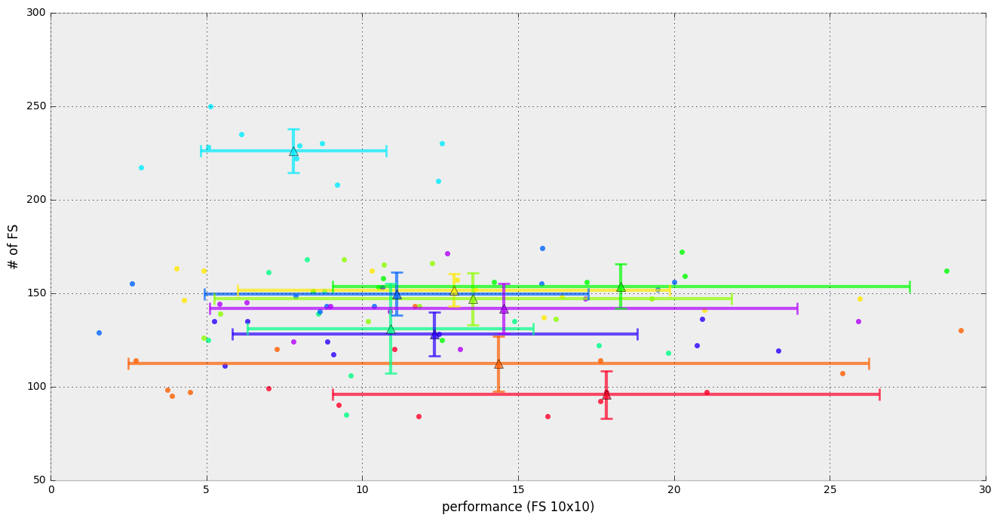

0.101256050124


In [42]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111, xlabel="performance (FS 10x10)",
                     ylabel="# of FS", xlim=[0,30])
for i in range(0, 10):
    ax.scatter(rel_eff_FS_10x10[i*10:(i+1)*10],
               nets_10x10_total[i*10:(i+1)*10], s=20, 
               alpha = 0.8,
               color=dr.plt.cm.gist_rainbow(int(i*25.5)))
    ax.errorbar(dr.np.average(rel_eff_FS_10x10[i*10:(i+1)*10]),
               dr.np.average(nets_10x10_total[i*10:(i+1)*10]),
               xerr=dr.np.std(rel_eff_FS_10x10[i*10:(i+1)*10]),
               yerr=dr.np.std(nets_10x10_total[i*10:(i+1)*10]),
               alpha = 0.7, elinewidth = 3,
               color=dr.plt.cm.gist_rainbow(int(i*25.5)),
               marker='^', ms=8, capsize = 6, capthick = 2)
dr.plt.show()
print dr.np.average(dr.np.divide(rel_eff_FS_10x10,
                                 nets_10x10[:,-1]))

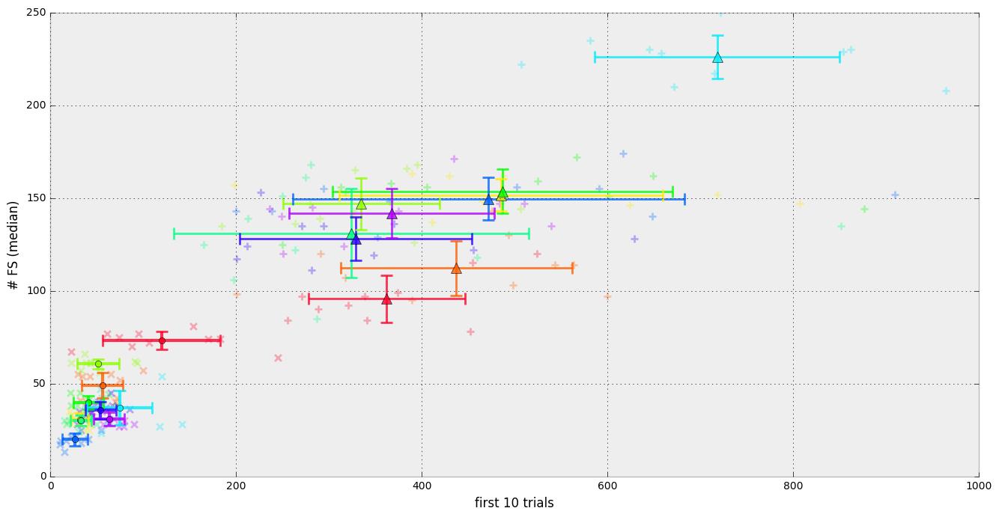

In [43]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111, xlabel="first 10 trials",
                     ylabel="# FS (median)", 
                     #xscale = 'log', yscale = 'log',
                     xlim = [0,1000], ylim = [0,250])
for i in range(0, 10):
    # 10x10
    ax.scatter(paths_first_10x10[i*10:(i+1)*10],
               nets_10x10_total[i*10:(i+1)*10], s=60, 
               alpha = 0.3, marker = '+', lw= 2,
               color=dr.plt.cm.gist_rainbow(int(i*25.5)))
    ax.errorbar(dr.np.average(paths_first_10x10[i*10:(i+1)*10]),
               dr.np.average(nets_10x10_total[i*10:(i+1)*10]),
               xerr=dr.np.std(paths_first_10x10[i*10:(i+1)*10]),
               yerr=dr.np.std(nets_10x10_total[i*10:(i+1)*10]),
               alpha = 0.8, elinewidth = 2, #color = 'b',
               color=dr.plt.cm.gist_rainbow(int(i*25.5)),
               marker='^', ms=10, capsize = 6, capthick = 2)
    # 5x5
    ax.scatter(paths_first[i*10:(i+1)*10],
               nets_5x5_total[i*10:(i+1)*10], s=40, 
               alpha = 0.3, marker = 'x', lw= 2,
               color=dr.plt.cm.gist_rainbow(int(i*25.5)))
    ax.errorbar(dr.np.average(paths_first[i*10:(i+1)*10]),
               dr.np.average(nets_5x5_total[i*10:(i+1)*10]),
               xerr=dr.np.std(paths_first[i*10:(i+1)*10]),
               yerr=dr.np.std(nets_5x5_total[i*10:(i+1)*10]),
               alpha = 0.8, elinewidth = 3, #color = 'b',
               color=dr.plt.cm.gist_rainbow(int(i*25.5)),
               marker='o', ms=6, capsize = 6, capthick = 2)
dr.plt.show()

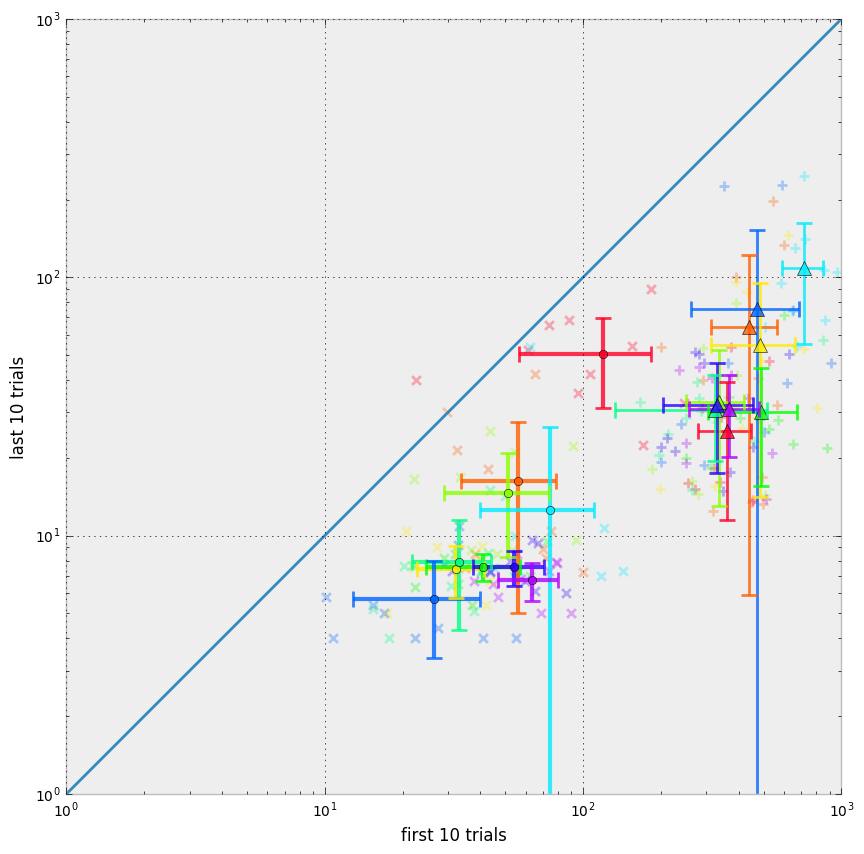

In [44]:
fig = dr.plt.figure(1, figsize=[10,10])
ax = fig.add_subplot(111, xlabel="first 10 trials",
                     ylabel="last 10 trials", 
                     xscale = 'log', yscale = 'log',
                     xlim = [1,1000], ylim = [1,1000])
for i in range(0, 10):
    # 10x10
    ax.scatter(paths_first_10x10[i*10:(i+1)*10],
               paths_last_10x10[i*10:(i+1)*10], s=60, 
               alpha = 0.3, marker = '+', lw= 2,
               color=dr.plt.cm.gist_rainbow(int(i*25.5)))
    ax.errorbar(dr.np.average(paths_first_10x10[i*10:(i+1)*10]),
               dr.np.average(paths_last_10x10[i*10:(i+1)*10]),
               xerr=dr.np.std(paths_first_10x10[i*10:(i+1)*10]),
               yerr=dr.np.std(paths_last_10x10[i*10:(i+1)*10]),
               alpha = 0.8, elinewidth = 2, #color = 'b',
               color=dr.plt.cm.gist_rainbow(int(i*25.5)),
               marker='^', ms=10, capsize = 6, capthick = 2)
    # 5x5
    ax.scatter(paths_first[i*10:(i+1)*10],
               paths_last[i*10:(i+1)*10], s=40, 
               alpha = 0.3, marker = 'x', lw= 2,
               color=dr.plt.cm.gist_rainbow(int(i*25.5)))
    ax.errorbar(dr.np.average(paths_first[i*10:(i+1)*10]),
               dr.np.average(paths_last[i*10:(i+1)*10]),
               xerr=dr.np.std(paths_first[i*10:(i+1)*10]),
               yerr=dr.np.std(paths_last[i*10:(i+1)*10]),
               alpha = 0.8, elinewidth = 3, #color = 'b',
               color=dr.plt.cm.gist_rainbow(int(i*25.5)),
               marker='o', ms=6, capsize = 6, capthick = 2)
ax.plot(dr.np.linspace(1,1000),dr.np.linspace(1,1000))
dr.plt.show()

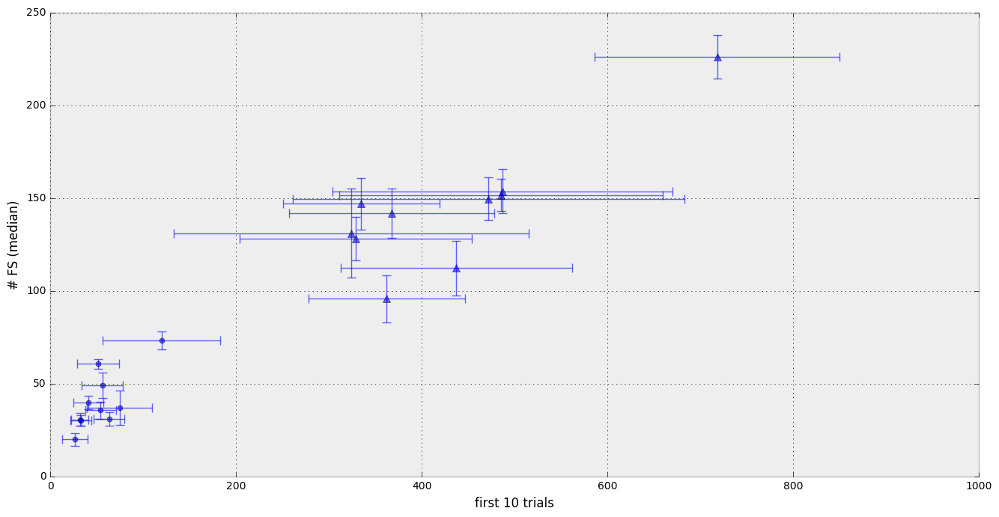

In [45]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111, xlabel="first 10 trials",
                     ylabel="# FS (median)", 
                     #xscale = 'log', yscale = 'log',
                     xlim = [0,1000], ylim = [0,250])
for i in range(0, 10):
    # 10x10    
    ax.errorbar(dr.np.average(paths_first_10x10[i*10:(i+1)*10]),
               dr.np.average(nets_10x10_total[i*10:(i+1)*10]),
               xerr=dr.np.std(paths_first_10x10[i*10:(i+1)*10]),
               yerr=dr.np.std(nets_10x10_total[i*10:(i+1)*10]),
               alpha = 0.6, elinewidth = 1, color = 'b',
               #color=dr.plt.cm.gist_rainbow(int(i*25.5))
               marker='^', ms=7, capsize = 4, capthick = 1)
    # 5x5
    ax.errorbar(dr.np.average(paths_first[i*10:(i+1)*10]),
               dr.np.average(nets_5x5_total[i*10:(i+1)*10]),
               xerr=dr.np.std(paths_first[i*10:(i+1)*10]),
               yerr=dr.np.std(nets_5x5_total[i*10:(i+1)*10]),
               alpha = 0.6, elinewidth = 1, color = 'b',
               #color=dr.plt.cm.gist_rainbow(int(i*25.5))
               marker='o', ms=5, capsize = 4, capthick = 1)
dr.plt.show()

In [46]:
# Сходимость на графе 10х10 за 1000 попыток
#взяты из старых данных. Испытания на насыщение не пересчитывались.
paths_10x10_1000 = []
nets_10x10_1000 = []
for i in xrange(1, 11):
    paths_10x10_1000.extend(get_data("10x10torus1000/all_paths_{0}.json".format(i)))
    nets_10x10_1000.extend(get_data("10x10torus1000/all_secondary_{0}.json".format(i)))

paths_10x10_1000 = dr.np.clip(dr.np.array(paths_10x10_1000),0,2000)
nets_10x10_1000 = dr.np.array(nets_10x10_1000)


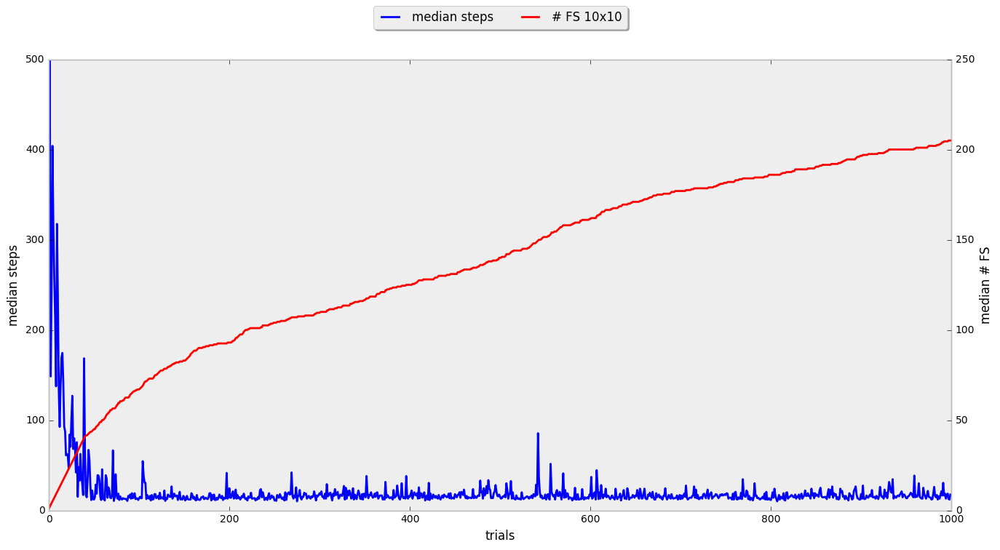

In [47]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111, xlabel="trials", ylabel="median steps")
ax.grid(0)
pt, = ax.plot(dr.np.median(paths_10x10_1000, axis=0), '-b')
ax2 = ax.twinx()
fs, = ax2.plot(dr.np.median(nets_10x10_1000, axis=0),  '-r')
ax2.set_ylabel('median # FS')
ax2.grid(0)
fig.legend(handles=[pt,fs], labels=['median steps','# FS 10x10'], ncol=2,
           loc='upper center', #bbox_to_anchor=(0.8, 0.85), 
           shadow=1)
dr.plt.show()

10


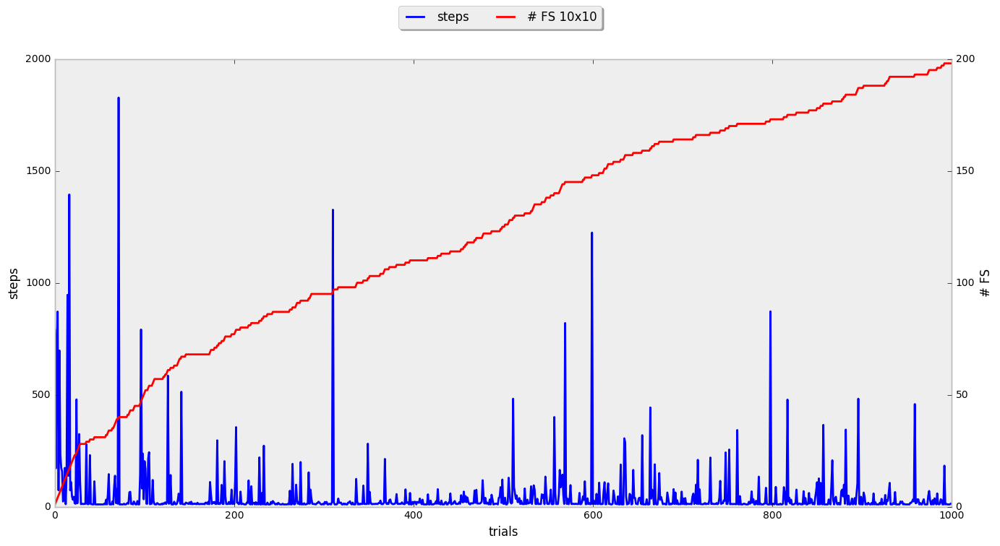

In [48]:
run=6
print len(paths_10x10_1000)
fig = dr.plt.figure(1)
ax = fig.add_subplot(111, xlabel="trials", ylabel="steps")
ax.grid(0)
pt, = ax.plot(paths_10x10_1000[run], '-b')
ax2 = ax.twinx()
fs, = ax2.plot(nets_10x10_1000[run],  '-r')
ax2.set_ylabel('# FS')
ax2.grid(0)
fig.legend(handles=[pt,fs], labels=['steps','# FS 10x10'], ncol=2,
           loc='upper center', #bbox_to_anchor=(0.8, 0.85), 
           shadow=1)
dr.plt.show()

### 8. Тор(10x10): Cравнение стохастического алгоритма обучения ФС с  Reinforcement Learning на одних и тех же графах.

Графики анологичны графикам в [пункте 6](#article_6). Но здесь приводятся результаты на случайных графах большего размера (тор 10x10). 
<font color='red'><b>Еще графики сравнения алгоритмов RL между собой, со случайным поиском и нашим алгоритмом находятся [в пункте 11](#section11) </b></font> 

In [49]:
fspaths_10x10 = []
rlpaths_10x10 = [] # Взято q-learning alpha=0.1, gamma=0.9, epsilon=0.01
qlearning01_10x10 = [] # Взято q-learning alpha=0.1, gamma=0.9, epsilon=0.1
for i in xrange(1, 11):
    #old data: "output/10x10_RL_vs_FS/all_paths_{0}.json"
    fspaths_10x10.extend(get_data("torus/10x10_other/stochasticenvironment/all_paths_{0}.json".format(i)))
    #old data: "output/10x10_RL_vs_FS/RL_all_path_{0}.json"
    rlpaths_10x10.extend(get_data(
        "torus/10x10_td_compare/stochasticenvironment/q-learning_(0.1,0.9, 0.01)_{0}.json".format(i)))
    qlearning01_10x10.extend(get_data(
        "torus/10x10_td_compare/stochasticenvironment/q-learning_(0.1,0.9, 0.1)_{0}.json".format(i)))
    
fspaths_10x10 = dr.np.clip(dr.np.array(fspaths_10x10),0,2000)
rlpaths_10x10 = dr.np.array(rlpaths_10x10)
qlearning01_10x10 = dr.np.array(qlearning01_10x10)

#### Пример динамики

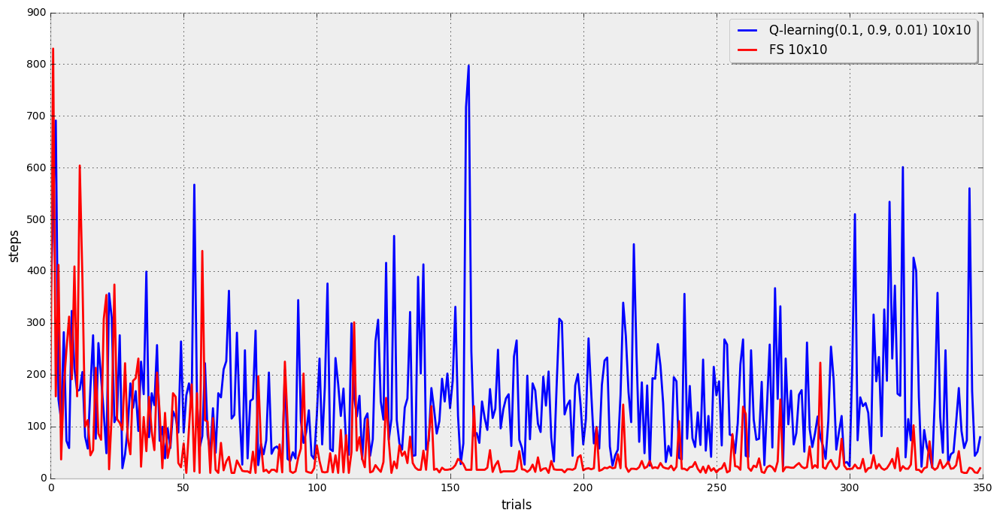

In [50]:
trial = 77
fig = dr.plt.figure(1)
ax = fig.add_subplot(111, xlabel="trials", 
                     ylabel="steps")
rl = ax.plot(rlpaths_10x10[trial], 'b', label = 'Q-learning(0.1, 0.9, 0.01) 10x10')
fs = ax.plot(fspaths_10x10[trial], 'r', label = 'FS 10x10')
dr.plt.legend(shadow=1)
dr.plt.show()

#### 8.1. Эффективность RL на торе 10х10

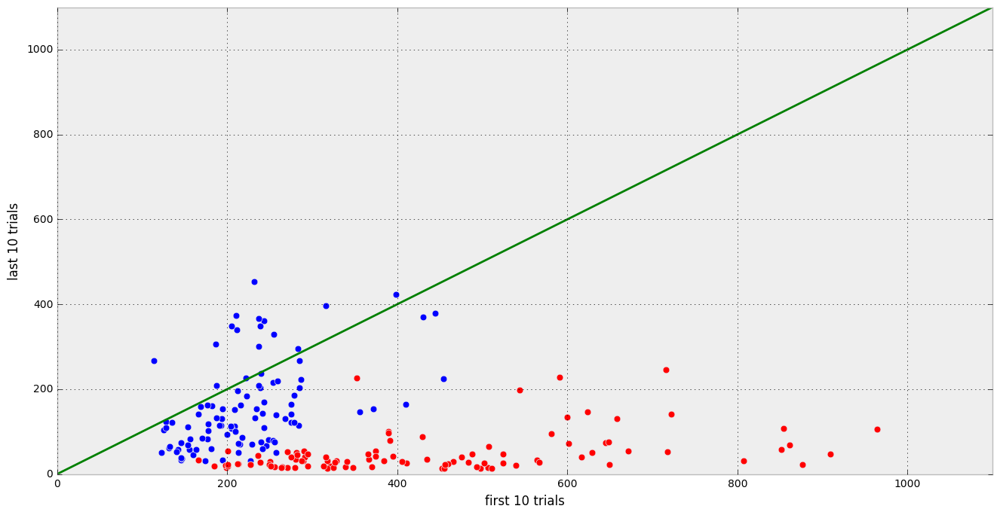

In [51]:
fig = dr.plt.figure(1)
ax =fig.add_subplot(111,xlabel='first 10 trials',xlim=[0,1100],
                     ylabel='last 10 trials',  ylim=[0,1100])
rl = ax.scatter(dr.np.average(rlpaths_10x10[:,:10], axis=1),
                dr.np.average(rlpaths_10x10[:,-10:], axis=1),
                c='b',s=40)
fs1 = ax.scatter(dr.np.average(paths_10x10[:,:10], axis=1),
                 dr.np.average(paths_10x10[:,-10:], axis=1), 
                 c='m', s=40)
fs2 = ax.scatter(dr.np.average(fspaths_10x10[:,:10], axis=1),
                 dr.np.average(fspaths_10x10[:,-10:], axis=1), 
                 c='r', s=40)
ax.plot(dr.np.linspace(0,1100),dr.np.linspace(0,1100),'g')
dr.plt.show()

In [52]:
rel_eff_RL_10x10 = dr.np.divide(dr.np.average(rlpaths_10x10[:,:10], axis=1),dr.np.average(rlpaths_10x10[:,-10:], axis=1))
print dr.np.average(rel_eff_RL_10x10)

2.00445913557


#### 8.2. Эффективность FS на тех же графах 10х10

In [53]:
rel_eff_FS2_10x10 = dr.np.divide(dr.np.average(fspaths_10x10[:,:10], axis=1),dr.np.average(fspaths_10x10[:,-10:], axis=1))
print dr.np.average(rel_eff_FS2_10x10)

13.3591716088


#### 8.3 Корреляция

Координаты: (среднее число шагов за последние 10 попыток для медианы в случае нашего алгоритма, тоже самое для RL).

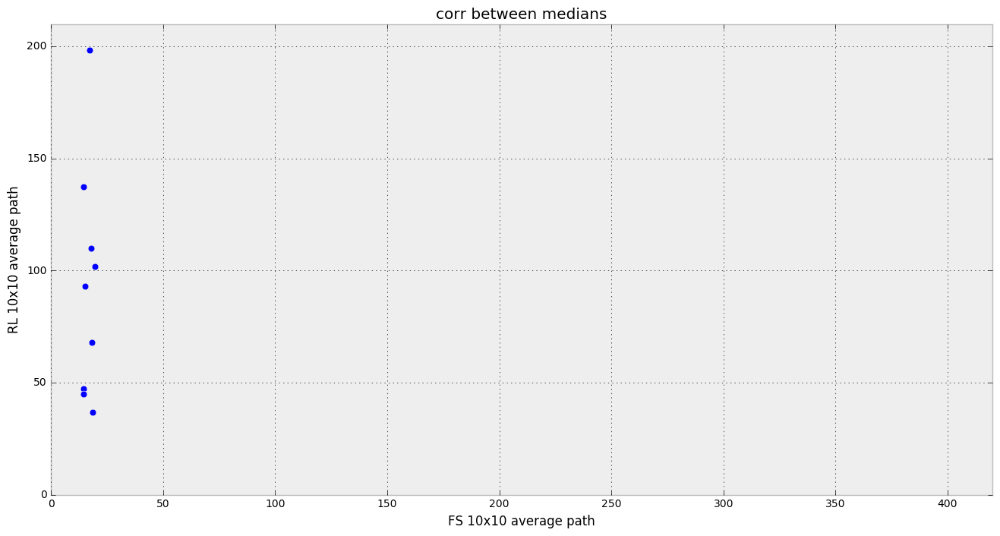

In [54]:
corr_fs_rl = [dr.np.average(dr.np.transpose(median_by_trial(fspaths_10x10))[-10:,:],axis=0),
           dr.np.average(dr.np.transpose(median_by_trial(rlpaths_10x10))[-10:,:],axis=0)]
fig = dr.plt.figure(1)
ax = fig.add_subplot(111,xlabel='FS 10x10 average path',
                     ylabel='RL 10x10 average path',
                     title = 'corr between medians',
                     ylim=[0,210], xlim=[0,420])
ax.scatter(corr_fs_rl[0],corr_fs_rl[1],s=40)
dr.plt.show()

#### Относительная средняя эффективность ФС к RL на торе 10х10

In [55]:
print dr.np.divide(corr_fs_rl[1],corr_fs_rl[0])
print dr.np.average(dr.np.divide(corr_fs_rl[1],corr_fs_rl[0]))

[  3.24827586   9.54166667  11.43227666   6.05537459   6.18591549
   1.98382749   4.6271809    5.1751269    3.08219178   3.68206522]
5.50139015665


#### 8.3 Сравнение средней длинны пути для медиан.

1.02092323284


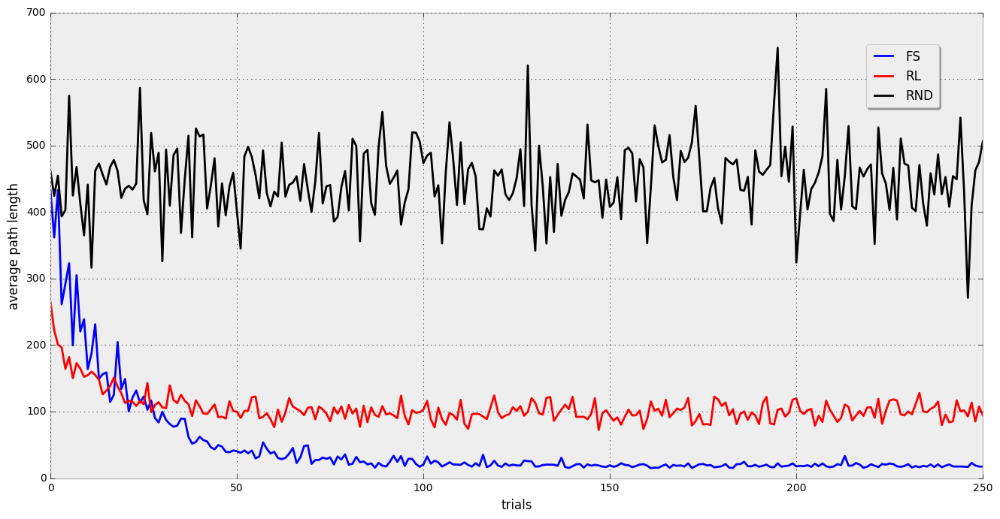

In [56]:
rndpaths_10x10 = [] 
for i in xrange(1, 11):
    #old data: "output/10x10_RL_compare/random_search_{0}.json".format(i))
    rndpaths_10x10.extend(get_data("torus/10x10_other/stochasticenvironment/rnd_paths_{0}.json".format(i)))
rndpaths_10x10 = dr.np.clip(dr.np.array(rndpaths_10x10),0,1000)
rnd_first_10x10 = dr.np.average(rndpaths_10x10[:,:10], axis=1)
rnd_last_10x10 = dr.np.average(rndpaths_10x10[:,-10:], axis=1)

rel_eff_rnd_10x10 = dr.np.divide(rnd_first_10x10,
                                rnd_last_10x10)
print dr.np.average(rel_eff_rnd_10x10)
fig = dr.plt.figure(1)
ax = fig.add_subplot(111,xlabel='trials', xlim = [0,250],
                     ylabel='average path length')
fs, = ax.plot(dr.np.average(median_by_trial(fspaths_10x10), 
                            axis=0),  '-b')
rl, = ax.plot(dr.np.average(median_by_trial(rlpaths_10x10), 
                            axis=0),  '-r')
rnd, = ax.plot(dr.np.average(median_by_trial(rndpaths_10x10), 
                            axis=0),  color = 'black')
fig.legend(handles=[fs,rl,rnd], labels=['FS','RL','RND'], 
           loc='upper center', bbox_to_anchor=(0.75, 0.8), 
           shadow=1)
dr.plt.show()

### 9. Тор 20х20

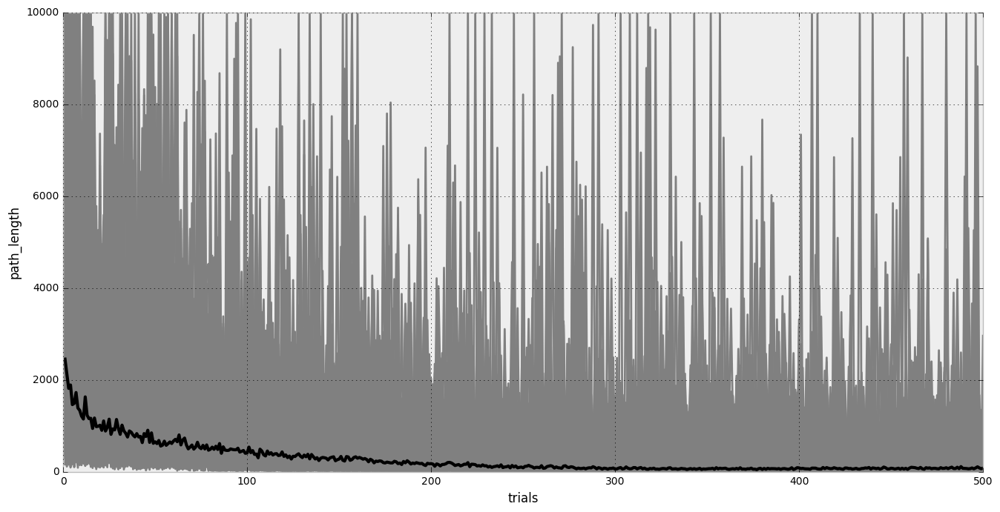

In [57]:
paths_20x20 = []
nets_20x20 = []

for i in xrange(1, 11):
    # old data: "output/20x20torus500/all_paths_{0}.json", "output/20x20torus500/all_secondary_{0}.json"
    paths_20x20.extend(get_data("torus/20x20/stochasticenvironment/all_paths_{0}.json".format(i)))
    nets_20x20.extend(get_data("torus/20x20/stochasticenvironment/all_secondary_{0}.json".format(i)))
    
paths_20x20 = dr.np.clip(dr.np.array(paths_20x20),0,10000)
nets_20x20 = dr.np.array(nets_20x20)
    
dr.black_gray_plot(paths_20x20, dr.trials_median(paths_20x20))

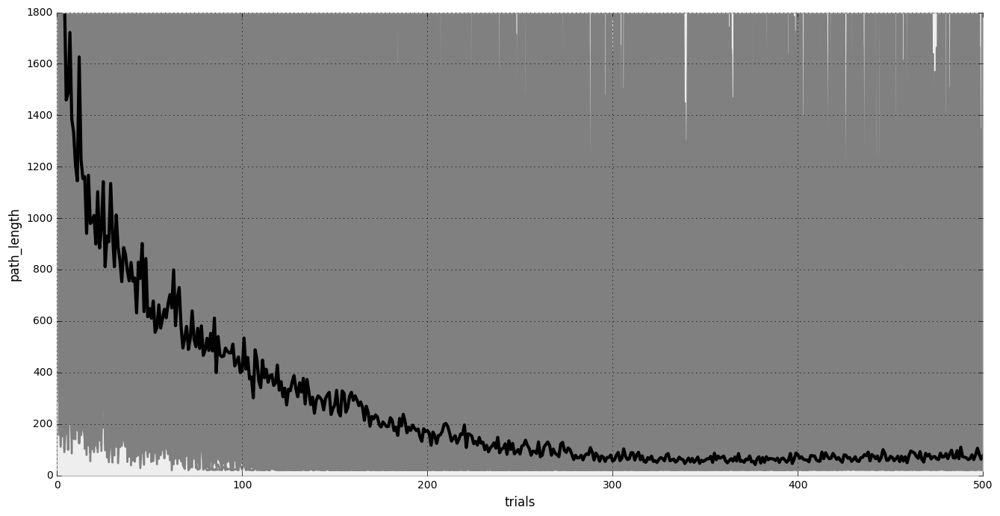

In [58]:
# Приближение по оси Y
dr.black_gray_plot(paths_20x20, dr.trials_median(paths_20x20), y_range=(0,1800))

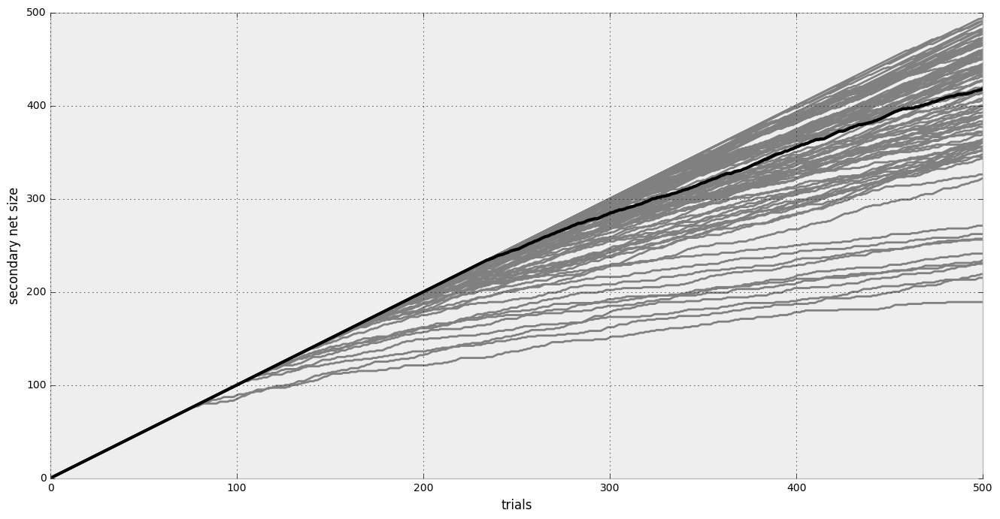

In [59]:
dr.black_gray_plot(nets_20x20, dr.trials_median(nets_20x20), y_label="secondary net size")

In [60]:
paths_first_20x20 = dr.np.average(paths_20x20[:,:10], axis=1)
paths_last_20x20 = dr.np.average(paths_20x20[:,-10:], axis=1)
nets_20x20_total = dr.np.average(nets_20x20[:,-1:], axis=1)

rel_eff_FS_20x20 = dr.np.divide(paths_first_20x20,
                                paths_last_20x20)
print dr.np.average(rel_eff_FS_20x20)

17.6323361192


In [61]:
rnd_paths_20x20 = [] 
# случайное блуждание производилось на других 10 сгенерированных графах, 
# но врятли результаты были бы сильно другими.
# В принципе, результат алгоритма обучения фс на начальных испытаниях это и есть случайное булждание в графе
for i in xrange(1, 11):
    rnd_paths_20x20.extend(get_data("torus/20x20/stochasticenvironment/rnd_paths_{0}.json".format(i)))

rnd_paths_20x20 = dr.np.clip(dr.np.array(rnd_paths_20x20),0,10000)
rnd_first_20x20 = dr.np.average(rnd_paths_20x20[:,:10], axis=1)
rnd_last_20x20 = dr.np.average(rnd_paths_20x20[:,-10:], axis=1)

rel_eff_rnd_20x20 = dr.np.divide(rnd_first_20x20,
                                rnd_last_20x20)
print dr.np.average(rel_eff_rnd_20x20)

1.15686811495


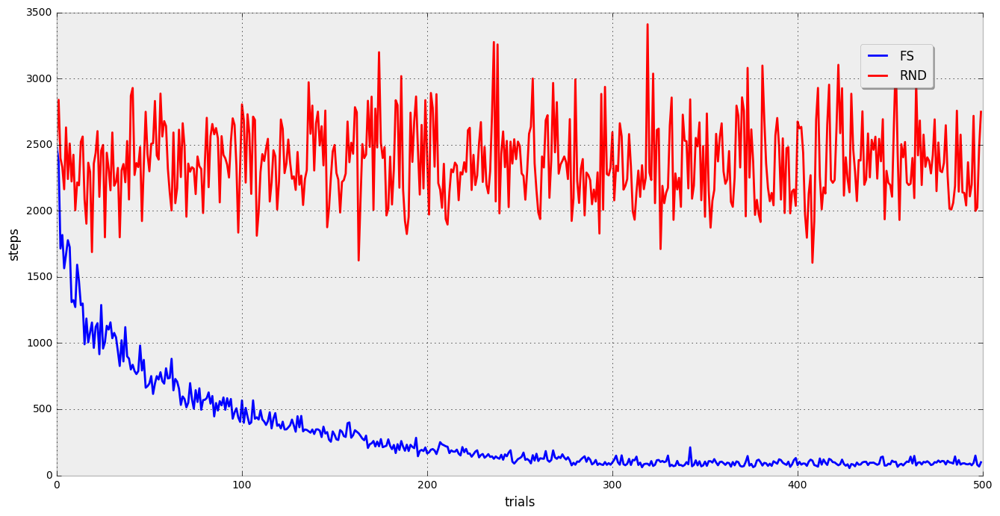

In [62]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111,xlabel='trials',
                     ylabel='steps')
fs, = ax.plot(dr.np.average(median_by_trial(paths_20x20), 
                            axis=0),  '-b')
rl, = ax.plot(dr.np.average(median_by_trial(rnd_paths_20x20), 
                            axis=0),  '-r')
fig.legend(handles=[fs,rl], labels=['FS','RND'], 
           loc='upper center', bbox_to_anchor=(0.75, 0.8), 
           shadow=1)
dr.plt.show()

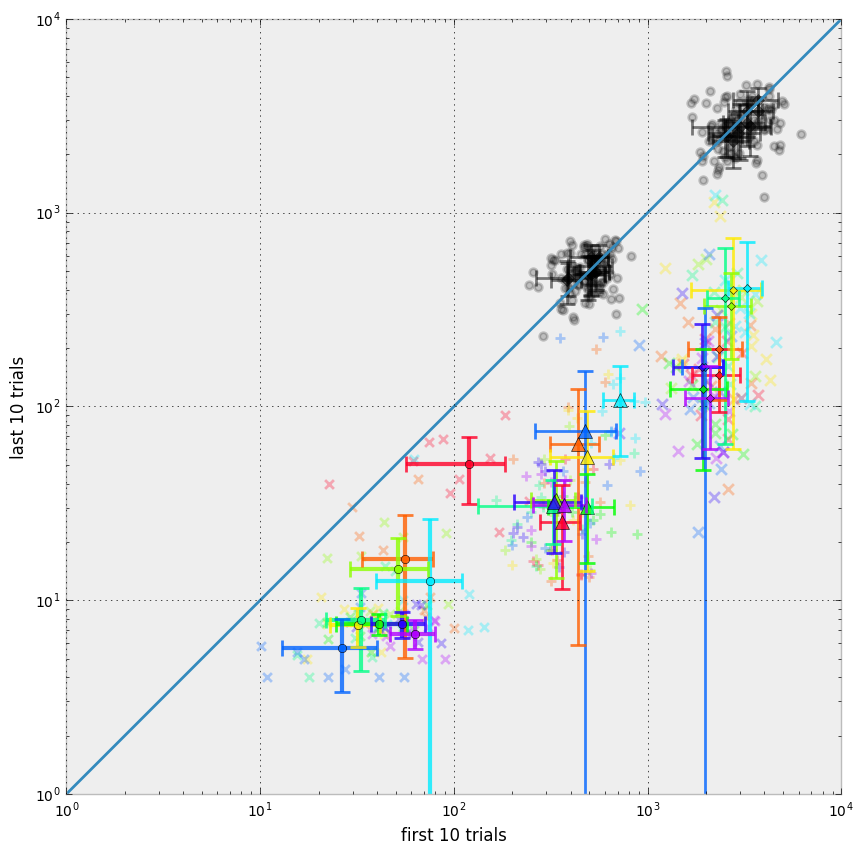

In [63]:
fig = dr.plt.figure(1, figsize=[10,10])
ax = fig.add_subplot(111, xlabel="first 10 trials",
                     ylabel="last 10 trials", 
                     xscale = 'log', yscale = 'log',
                     xlim = [1,10000], ylim = [1,10000])
for i in range(0, 10):
    # 10x10
    ax.scatter(paths_first_10x10[i*10:(i+1)*10],
               paths_last_10x10[i*10:(i+1)*10], s=60, 
               alpha = 0.3, marker = '+', lw= 2,
               color=dr.plt.cm.gist_rainbow(int(i*25.5)))
    ax.errorbar(dr.np.average(paths_first_10x10[i*10:(i+1)*10]),
               dr.np.average(paths_last_10x10[i*10:(i+1)*10]),
               xerr=dr.np.std(paths_first_10x10[i*10:(i+1)*10]),
               yerr=dr.np.std(paths_last_10x10[i*10:(i+1)*10]),
               alpha = 0.8, elinewidth = 2, #color = 'b',
               color=dr.plt.cm.gist_rainbow(int(i*25.5)),
               marker='^', ms=10, capsize = 6, capthick = 2)
    # 5x5
    ax.scatter(paths_first[i*10:(i+1)*10],
               paths_last[i*10:(i+1)*10], s=40, 
               alpha = 0.3, marker = 'x', lw= 2,
               color=dr.plt.cm.gist_rainbow(int(i*25.5)))
    ax.errorbar(dr.np.average(paths_first[i*10:(i+1)*10]),
               dr.np.average(paths_last[i*10:(i+1)*10]),
               xerr=dr.np.std(paths_first[i*10:(i+1)*10]),
               yerr=dr.np.std(paths_last[i*10:(i+1)*10]),
               alpha = 0.8, elinewidth = 3, #color = 'b',
               color=dr.plt.cm.gist_rainbow(int(i*25.5)),
               marker='o', ms=6, capsize = 6, capthick = 2)
    #20x20
    ax.scatter(paths_first_20x20[i*10:(i+1)*10],
               paths_last_20x20[i*10:(i+1)*10], s=60, 
               alpha = 0.3, marker = 'x', lw= 2,
               color=dr.plt.cm.gist_rainbow(int(i*25.5)))
    ax.errorbar(dr.np.average(paths_first_20x20[i*10:(i+1)*10]),
               dr.np.average(paths_last_20x20[i*10:(i+1)*10]),
               xerr=dr.np.std(paths_first_20x20[i*10:(i+1)*10]),
               yerr=dr.np.std(paths_last_20x20[i*10:(i+1)*10]),
               alpha = 0.8, elinewidth = 2, #color = 'b',
               color=dr.plt.cm.gist_rainbow(int(i*25.5)),
               marker='D', ms=4, capsize = 6, capthick = 2)
    # rnd 10x10
    ax.scatter(rnd_first_10x10[i*10:(i+1)*10],
               rnd_last_10x10[i*10:(i+1)*10], s=30, 
               alpha = 0.2, marker = 'o', lw= 2,
               color='black')
    ax.errorbar(dr.np.average(rnd_first_10x10[i*10:(i+1)*10]),
               dr.np.average(rnd_last_10x10[i*10:(i+1)*10]),
               xerr=dr.np.std(rnd_first_10x10[i*10:(i+1)*10]),
               yerr=dr.np.std(rnd_last_10x10[i*10:(i+1)*10]),
               alpha = 0.5, elinewidth = 2, #color = 'b',
               color='black',
               marker='D', ms=6, capsize = 6, capthick = 2)   
    # rnd 20x20
    ax.scatter(rnd_first_20x20[i*10:(i+1)*10],
               rnd_last_20x20[i*10:(i+1)*10], s=30, 
               alpha = 0.2, marker = 'o', lw= 2,
               color='black')
    ax.errorbar(dr.np.average(rnd_first_20x20[i*10:(i+1)*10]),
               dr.np.average(rnd_last_20x20[i*10:(i+1)*10]),
               xerr=dr.np.std(rnd_first_20x20[i*10:(i+1)*10]),
               yerr=dr.np.std(rnd_last_20x20[i*10:(i+1)*10]),
               alpha = 0.5, elinewidth = 2, #color = 'b',
               color='black',
               marker='D', ms=6, capsize = 6, capthick = 2)    
ax.plot(dr.np.linspace(1,10000),dr.np.linspace(1,10000))
dr.plt.show()

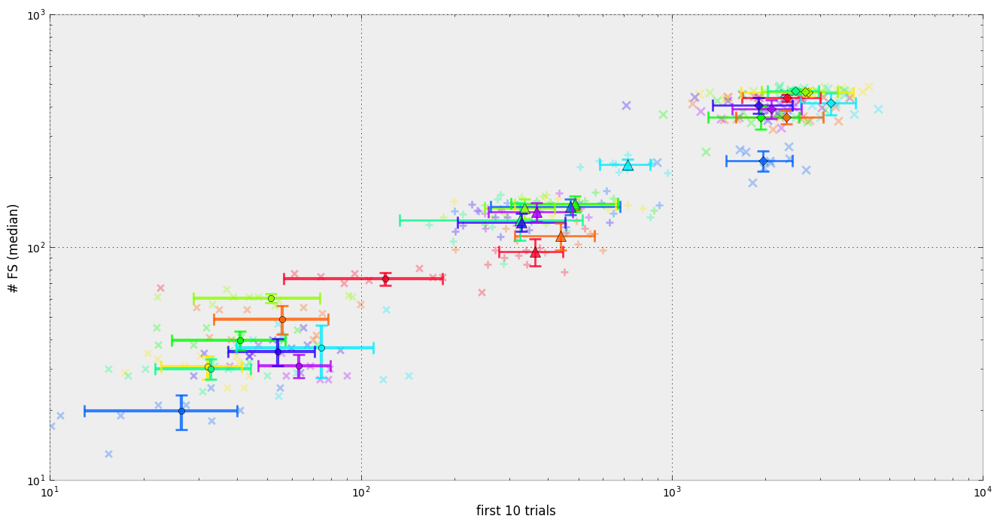

In [64]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111, xlabel="first 10 trials",
                     ylabel="# FS (median)", 
                     xscale = 'log', yscale = 'log',
                     xlim = [10,10000], ylim = [10,1000])
for i in range(0, 10):
    # 10x10
    ax.scatter(paths_first_10x10[i*10:(i+1)*10],
               nets_10x10_total[i*10:(i+1)*10], s=60, 
               alpha = 0.3, marker = '+', lw= 2,
               color=dr.plt.cm.gist_rainbow(int(i*25.5)))
    ax.errorbar(dr.np.average(paths_first_10x10[i*10:(i+1)*10]),
               dr.np.average(nets_10x10_total[i*10:(i+1)*10]),
               xerr=dr.np.std(paths_first_10x10[i*10:(i+1)*10]),
               yerr=dr.np.std(nets_10x10_total[i*10:(i+1)*10]),
               alpha = 0.8, elinewidth = 2, #color = 'b',
               color=dr.plt.cm.gist_rainbow(int(i*25.5)),
               marker='^', ms=10, capsize = 6, capthick = 2)
    # 5x5
    ax.scatter(paths_first[i*10:(i+1)*10],
               nets_5x5_total[i*10:(i+1)*10], s=40, 
               alpha = 0.3, marker = 'x', lw= 2,
               color=dr.plt.cm.gist_rainbow(int(i*25.5)))
    ax.errorbar(dr.np.average(paths_first[i*10:(i+1)*10]),
               dr.np.average(nets_5x5_total[i*10:(i+1)*10]),
               xerr=dr.np.std(paths_first[i*10:(i+1)*10]),
               yerr=dr.np.std(nets_5x5_total[i*10:(i+1)*10]),
               alpha = 0.8, elinewidth = 3, #color = 'b',
               color=dr.plt.cm.gist_rainbow(int(i*25.5)),
               marker='o', ms=6, capsize = 6, capthick = 2)
    #20x20
    ax.scatter(paths_first_20x20[i*10:(i+1)*10],
               nets_20x20_total[i*10:(i+1)*10], s=60, 
               alpha = 0.3, marker = 'x', lw= 2,
               color=dr.plt.cm.gist_rainbow(int(i*25.5)))
    ax.errorbar(dr.np.average(paths_first_20x20[i*10:(i+1)*10]),
               dr.np.average(nets_20x20_total[i*10:(i+1)*10]),
               xerr=dr.np.std(paths_first_20x20[i*10:(i+1)*10]),
               yerr=dr.np.std(nets_20x20_total[i*10:(i+1)*10]),
               alpha = 0.8, elinewidth = 2, #color = 'b',
               color=dr.plt.cm.gist_rainbow(int(i*25.5)),
               marker='D', ms=6, capsize = 6, capthick = 2)
dr.plt.show()

### 10.1. Масштабируемость

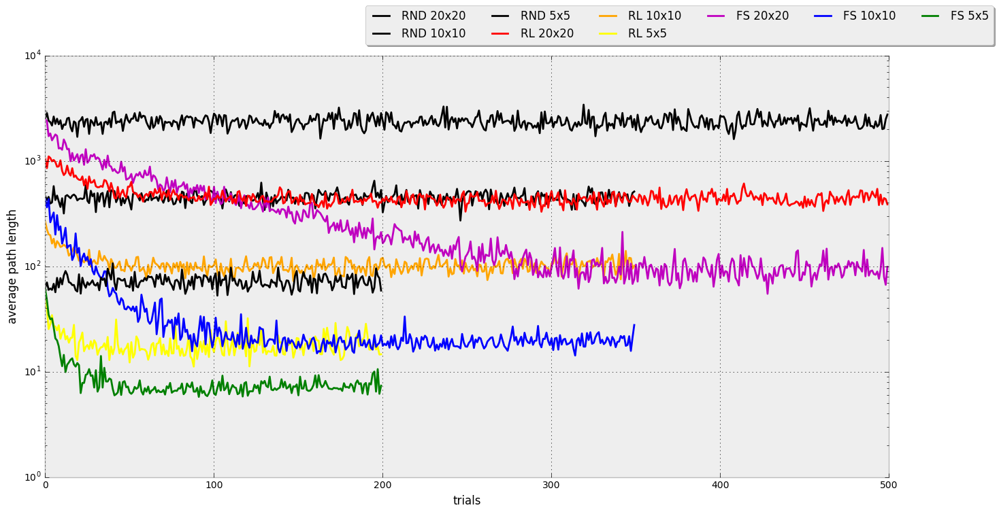

In [65]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111,xlabel='trials', xlim=[0,500], 
                     ylabel='average path length', 
                     yscale='log')


rnd20, = ax.plot(dr.np.average(median_by_trial(rnd_paths_20x20), 
                             axis=0), color='black')
rnd10, = ax.plot(dr.np.average(median_by_trial(rndpaths_10x10), 
                             axis=0), color='black')
rl10, = ax.plot(dr.np.average(median_by_trial(rlpaths_10x10),
                              axis=0),  color='orange')
rl5, = ax.plot(dr.np.average(median_by_trial(rl_paths_5x5), 
                             axis=0), color='yellow')
fs20, = ax.plot(dr.np.average(median_by_trial(paths_20x20), 
                              axis=0),  '-m')
fs10, = ax.plot(dr.np.average(median_by_trial(fspaths_10x10), 
                              axis=0),  '-b')
fs5, = ax.plot(dr.np.average(median_by_trial(paths_5x5), 
                             axis=0),  '-g')

#добавил недостающие rl20 и rnd5:

qlearning_20x20 = [] # q-learning (0.1,0.9, 0.01)
rnd_5x5 = []
for i in xrange(1, 11):
    qlearning_20x20.extend(get_data(
        "torus/20x20/stochasticenvironment/q-learning_(0.1,0.9, 0.01)_{0}.json".format(i)))
    rnd_5x5.extend(get_data(
        "torus/5x5/stochasticenvironment/rnd_paths_{0}.json".format(i)))
    
qlearning_20x20 = dr.np.array(qlearning_20x20)    
rnd_5x5 = dr.np.array(rnd_5x5)

rl20, = ax.plot(dr.np.average(median_by_trial(qlearning_20x20), axis=0), color='red')
rnd5, = ax.plot(dr.np.average(median_by_trial(rnd_5x5), axis=0), color='black')

fig.legend(handles=[rnd20,rnd10,rnd5,
                    rl20,rl10,rl5, 
                    fs20,fs10,fs5], 
           labels=['RND 20x20','RND 10x10','RND 5x5',
                   'RL 20x20','RL 10x10','RL 5x5',
                   'FS 20x20','FS 10x10','FS 5x5'], 
           loc='upper right', 
           shadow=1, ncol=6)
dr.plt.show()

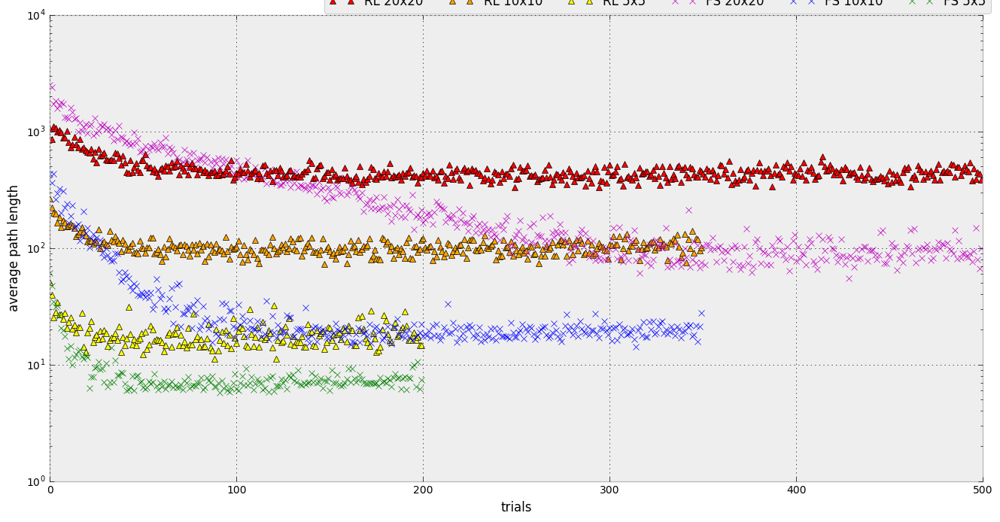

In [66]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111,xlabel='trials', xlim=[0,500], 
                     ylabel='average path length', 
                     yscale='log')


#rnd20, = ax.plot(dr.np.average(median_by_trial(rnd_paths_20x20), 
#                             axis=0), color='black')
#rnd10, = ax.plot(dr.np.average(median_by_trial(rndpaths_10x10), 
#                             axis=0), color='black')
rl_marker = '^'
rl10, = ax.plot(dr.np.average(median_by_trial(rlpaths_10x10),
                              axis=0), marker=rl_marker, linestyle='None', color='orange')
rl5, = ax.plot(dr.np.average(median_by_trial(rl_paths_5x5), 
                             axis=0), marker=rl_marker, linestyle='None', color='yellow')
fs20, = ax.plot(dr.np.average(median_by_trial(paths_20x20), 
                              axis=0), 'xm')
fs10, = ax.plot(dr.np.average(median_by_trial(fspaths_10x10), 
                              axis=0), 'xb')
fs5, = ax.plot(dr.np.average(median_by_trial(paths_5x5), 
                             axis=0),   'xg')

#добавил недостающие rl20 и rnd5:

qlearning_20x20 = [] # q-learning (0.1,0.9, 0.01)
rnd_5x5 = []
for i in xrange(1, 11):
    qlearning_20x20.extend(get_data(
        "torus/20x20/stochasticenvironment/q-learning_(0.1,0.9, 0.01)_{0}.json".format(i)))
    rnd_5x5.extend(get_data(
        "torus/5x5/stochasticenvironment/rnd_paths_{0}.json".format(i)))
    
qlearning_20x20 = dr.np.array(qlearning_20x20)    
rnd_5x5 = dr.np.array(rnd_5x5)

rl20, = ax.plot(dr.np.average(median_by_trial(qlearning_20x20), axis=0), 
                marker=rl_marker, linestyle='None', color='red')
#rnd5, = ax.plot(dr.np.average(median_by_trial(rnd_5x5), axis=0), color='black')

fig.legend(handles=[#rnd20,rnd10,rnd5,
                    rl20,rl10,rl5, 
                    fs20,fs10,fs5], 
           labels=[#'RND 20x20','RND 10x10','RND 5x5',
                   'RL 20x20','RL 10x10','RL 5x5',
                   'FS 20x20','FS 10x10','FS 5x5'], 
           loc='lower left', bbox_to_anchor=(0.264, 0.835), 
           shadow=0, ncol=6)
dr.plt.savefig("rl_fs_compare_stoch_env.pdf")
dr.plt.show()


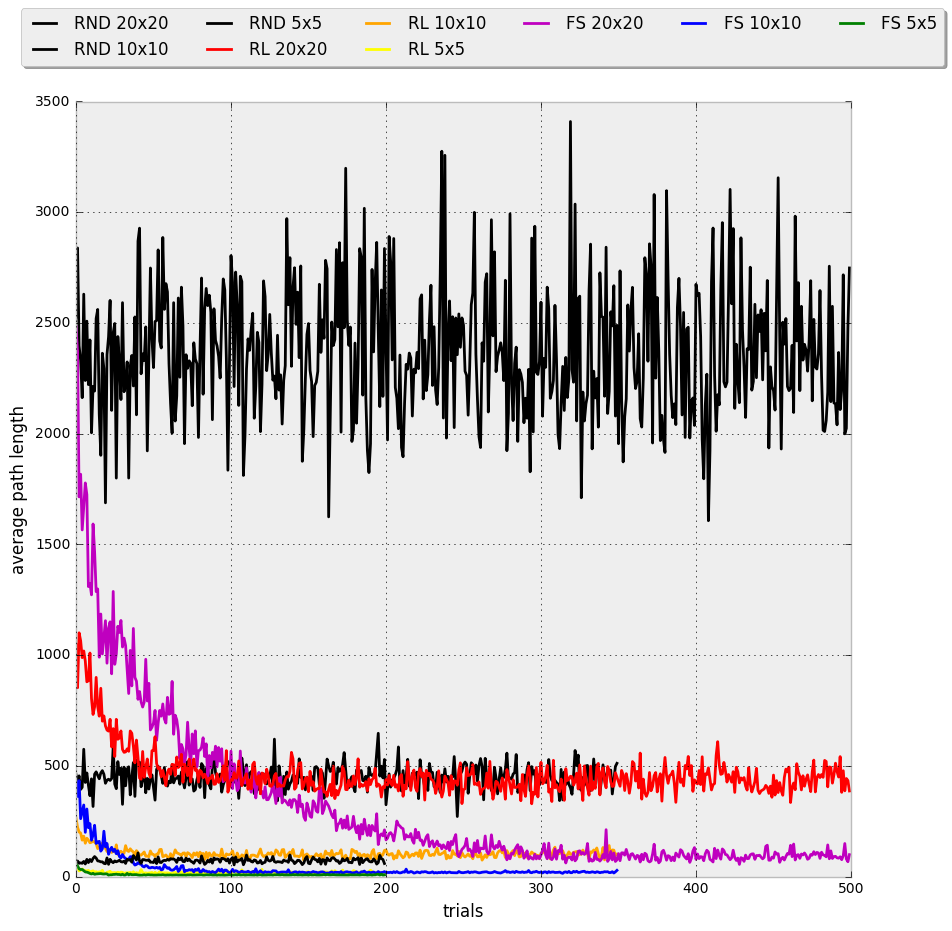

In [67]:
fig = dr.plt.figure(1, figsize=[10,10])
ax = fig.add_subplot(111,xlabel='trials', xlim=[0,500], 
                     ylabel='average path length', 
                     yscale='linear')
#ax.plot(
rnd20, = ax.plot(dr.np.average(median_by_trial(rnd_paths_20x20), 
                             axis=0), color='black')
rnd10, = ax.plot(dr.np.average(median_by_trial(rndpaths_10x10), 
                             axis=0), color='black')
rl10, = ax.plot(dr.np.average(median_by_trial(rlpaths_10x10),
                              axis=0),  color="orange")
rl5, = ax.plot(dr.np.average(median_by_trial(rl_paths_5x5), 
                             axis=0), color='yellow')
fs20, = ax.plot(dr.np.average(median_by_trial(paths_20x20), 
                              axis=0),  '-m')
fs10, = ax.plot(dr.np.average(median_by_trial(fspaths_10x10), 
                              axis=0),  '-b')
fs5, = ax.plot(dr.np.average(median_by_trial(paths_5x5), 
                             axis=0),  '-g')

#добавил недостающие rnd5, rl20:
rnd5, = ax.plot(dr.np.average(median_by_trial(rnd_5x5),
                              axis=0), color='black')
rl20, = ax.plot(dr.np.average(median_by_trial(qlearning_20x20),
                              axis=0), color='red')

fig.legend(handles=[rnd20, rnd10, rnd5,
                    rl20, rl10, rl5,
                    fs20, fs10, fs5], 
           labels=['RND 20x20', 'RND 10x10', 'RND 5x5',
                   'RL 20x20', 'RL 10x10', 'RL 5x5',
                   'FS 20x20', 'FS 10x10', 'FS 5x5'], 
           loc='upper right', 
           shadow=1, ncol=6)
dr.plt.show()

### 10.2. Сравнение эффективности

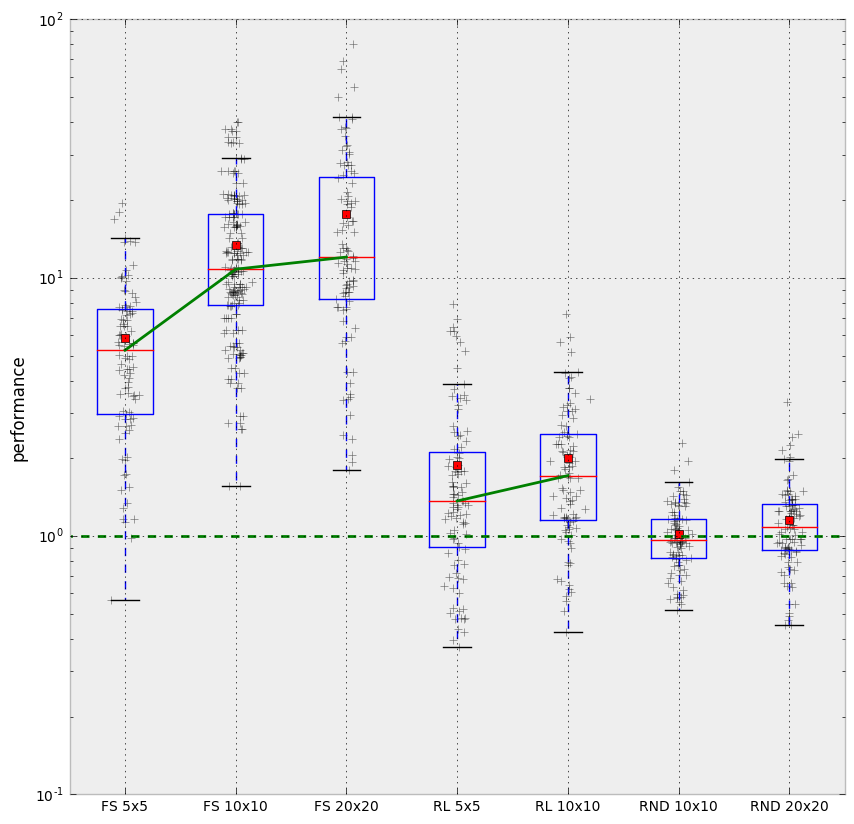

In [68]:
fig = dr.plt.figure(1, figsize=[10,10])
ax = fig.add_subplot(111, ylabel='performance', yscale='log')
ax.scatter(dr.np.random.normal(1, 0.05, size=len(rel_eff_FS_5x5)),rel_eff_FS_5x5, alpha=0.5, s=40, marker='+', color='black')
ax.scatter(dr.np.random.normal(2, 0.05, size=len(dr.np.concatenate((rel_eff_FS_10x10,rel_eff_FS2_10x10)))),
           dr.np.concatenate((rel_eff_FS_10x10,rel_eff_FS2_10x10)), alpha=0.5, s=40, marker='+', color='black')
ax.scatter(dr.np.random.normal(3, 0.05, size=len(rel_eff_FS_20x20)),rel_eff_FS_20x20, alpha=0.5, s=40, marker='+', color='black')
ax.scatter(dr.np.random.normal(4, 0.05, size=len(rel_eff_RL_5x5)),rel_eff_RL_5x5, alpha=0.5, s=40, marker='+', color='black')
ax.scatter(dr.np.random.normal(5, 0.05, size=len(rel_eff_RL_10x10)),rel_eff_RL_10x10, alpha=0.5, s=40, marker='+', color='black')
ax.scatter(dr.np.random.normal(6, 0.05, size=len(rel_eff_rnd_10x10)),rel_eff_rnd_10x10, alpha=0.5, s=40, marker='+', color='black')
ax.scatter(dr.np.random.normal(7, 0.05, size=len(rel_eff_rnd_20x20)),rel_eff_rnd_20x20, alpha=0.5, s=40, marker='+', color='black')
ax.boxplot([rel_eff_FS_5x5,dr.np.concatenate((rel_eff_FS_10x10,rel_eff_FS2_10x10)),
            rel_eff_FS_20x20,rel_eff_RL_5x5,rel_eff_RL_10x10,rel_eff_rnd_10x10,rel_eff_rnd_20x20], 
           labels=['FS 5x5','FS 10x10','FS 20x20','RL 5x5','RL 10x10','RND 10x10','RND 20x20'],
           showmeans=1, showfliers=0, notch=0, sym='+', vert=1, whis=1.5)
ax.plot([1,1,1,1,1,1,1,1,1], 'g--', lw=2)
ax.plot([1,2,3],[dr.np.median(rel_eff_FS_5x5),
                 dr.np.median(dr.np.concatenate((rel_eff_FS_10x10,rel_eff_FS2_10x10))),
                 dr.np.median(rel_eff_FS_20x20)],'g')
ax.plot([4,5],[dr.np.median(rel_eff_RL_5x5),dr.np.median(rel_eff_RL_10x10)],'g')
dr.plt.show()

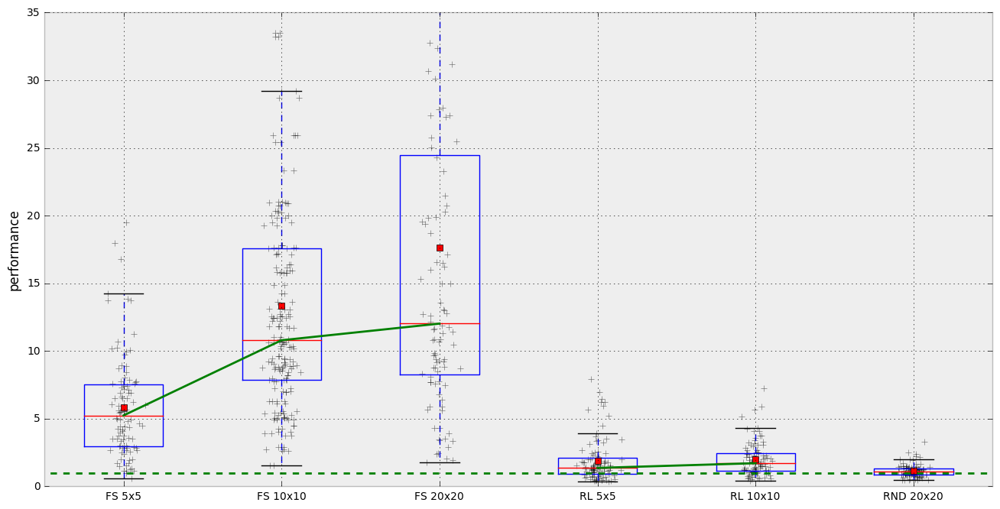

Run      |     Median       |    Average
FS 5x5   |  5.24307692308  |  5.82676568845
FS 10x10 |  10.7955777136  |  13.3591716088
FS 20x20   |  12.0265371848  |  17.6323361192
RL 5x5   |  1.36764733977  |  1.89163449369
RL 10x10 |  1.71512448595  |  2.00445913557
RND 20x20 |  1.08187469599  |  1.15686811495


In [69]:
fig = dr.plt.figure(1)
ax = fig.add_subplot(111, ylabel='performance', yscale='linear', ylim=[0,35])
ax.scatter(dr.np.random.normal(1, 0.05, size=len(rel_eff_FS_5x5)),rel_eff_FS_5x5, alpha=0.5, s=40, marker='+', color='black')
ax.scatter(dr.np.random.normal(2, 0.05, size=len(dr.np.concatenate((rel_eff_FS_10x10,rel_eff_FS2_10x10)))),
           dr.np.concatenate((rel_eff_FS_10x10,rel_eff_FS2_10x10)), alpha=0.5, s=40, marker='+', color='black')
ax.scatter(dr.np.random.normal(3, 0.05, size=len(rel_eff_FS_20x20)),rel_eff_FS_20x20, alpha=0.5, s=40, marker='+', color='black')
ax.scatter(dr.np.random.normal(4, 0.05, size=len(rel_eff_RL_5x5)),rel_eff_RL_5x5, alpha=0.5, s=40, marker='+', color='black')
ax.scatter(dr.np.random.normal(5, 0.05, size=len(rel_eff_RL_10x10)),rel_eff_RL_10x10, alpha=0.5, s=40, marker='+', color='black')
ax.scatter(dr.np.random.normal(6, 0.05, size=len(rel_eff_rnd_20x20)),rel_eff_rnd_20x20, alpha=0.5, s=40, marker='+', color='black')
ax.boxplot([rel_eff_FS_5x5,dr.np.concatenate((rel_eff_FS_10x10,rel_eff_FS2_10x10)),
            rel_eff_FS_20x20,rel_eff_RL_5x5,rel_eff_RL_10x10,rel_eff_rnd_20x20], 
           labels=['FS 5x5','FS 10x10','FS 20x20','RL 5x5','RL 10x10','RND 20x20'],
           showmeans=1, showfliers=0, notch=0, sym='+', vert=1, whis=1.5)
ax.plot([1,1,1,1,1,1,1,1], 'g--', lw=2)
ax.plot([1,2,3],[dr.np.median(rel_eff_FS_5x5),
                 dr.np.median(dr.np.concatenate((rel_eff_FS_10x10,rel_eff_FS2_10x10))),
                 dr.np.median(rel_eff_FS_20x20)],'g')
ax.plot([4,5],[dr.np.median(rel_eff_RL_5x5),dr.np.median(rel_eff_RL_10x10)],'g')
dr.plt.show()
print 'Run      |     Median       |    Average'
print 'FS 5x5   | ', dr.np.median(rel_eff_FS_5x5), ' | ', dr.np.average(rel_eff_FS_5x5)
print 'FS 10x10 | ', dr.np.median(dr.np.concatenate((rel_eff_FS_10x10,rel_eff_FS2_10x10))), ' | ', dr.np.average(dr.np.concatenate((rel_eff_FS_10x10,rel_eff_FS2_10x10)))
print 'FS 20x20   | ', dr.np.median(rel_eff_FS_20x20), ' | ', dr.np.average(rel_eff_FS_20x20)
print 'RL 5x5   | ', dr.np.median(rel_eff_RL_5x5), ' | ', dr.np.average(rel_eff_RL_5x5)
print 'RL 10x10 | ', dr.np.median(rel_eff_RL_10x10), ' | ', dr.np.average(rel_eff_RL_10x10)
print 'RND 20x20 | ', dr.np.median(rel_eff_rnd_20x20), ' | ', dr.np.average(rel_eff_rnd_20x20)

### <a id='section11'></a> 11. Сравнение эффективности алгоритма SARSA и Q-LEARNING с различными параметрами

Stochastic Environment(доступность переходов меняется между испытаниями)


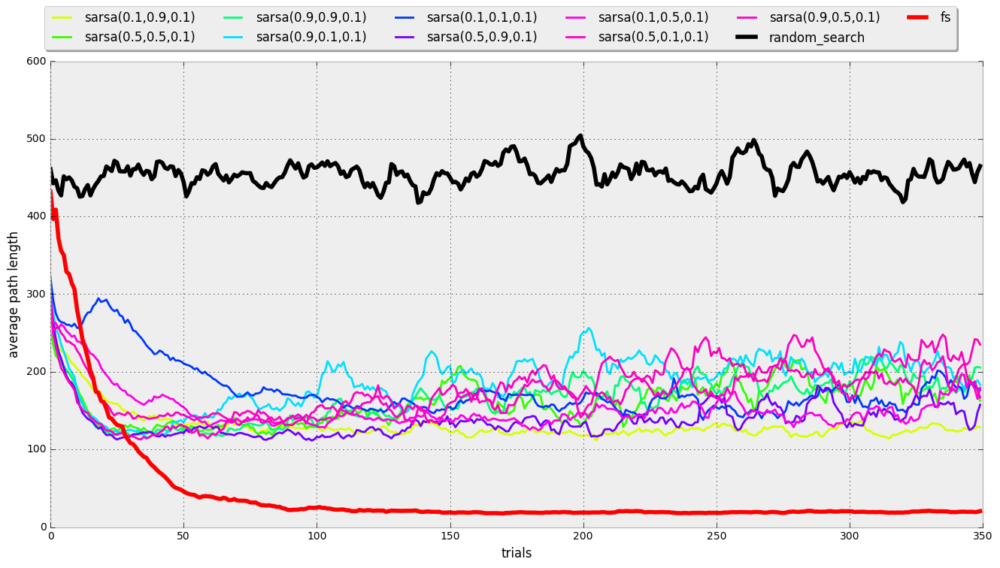

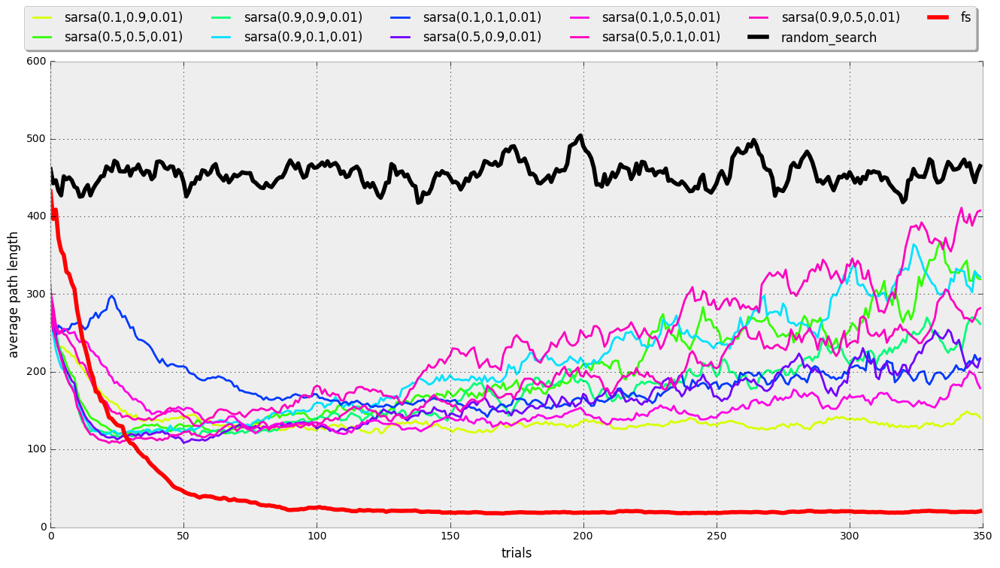

Лучший результат Sarsa показывает с параметрами alpha=0.1, gamma=0.9


In [70]:
average_median = lambda paths: dr.np.average(median_by_trial(paths), axis=0) # для краткости

# графики среднего значения слишком скакали, поэтому для понятности пришлось немного сгладить.
def last_n_averages(values, n): 
    l =[]
    for i in xrange(0, len(values)):
        part = values[max(0, i + 1 - n): i + 1]
        l.append(sum(part) / float(len(part)))
    return l

aa = lambda paths, n: last_n_averages(average_median(paths), n) # для еще большей краткости

def vizualize_10x10_rl(env_type, epsilon, algorithm_name):
    """
    Во избежание постоянных копирований собрал этот код в функцию. 
    Параметры принимают только определенные значения описанные ниже:
    env_type: "markovenvironment" | "stochasticenvironment" | "changestatestochasticityenv"
    epsilon: 0.1 | 0.01
    algorithm_name: "sarsa" | "q-learning"
    """
    params = [.1, .5, .9] # значения для alpha и gamma, что использовались в алгоримах
    rl_algs = {(alpha, gamma):[] for alpha in params for gamma in params} 
    
    random_search = []
    fs_learning = []

    # загружаем результаты испытаний
    folder_rl = join_path(results_dirs, "torus/10x10_td_compare/", env_type)
    folder_other = join_path(results_dirs, "torus/10x10_other/", env_type)
    for i in xrange(1, 11):
        random_search.extend(dr.get_json_data(folder_other+"/rnd_paths_{0}.json".format(i)))
        fs_learning.extend(dr.get_json_data(folder_other+"/all_paths_{0}.json".format(i)))
        for alpha, gamma in rl_algs:
            #примеры файлов в папке
            #q-learning_(0.1,0.1, 0.01)_10.json  
            #sarsa_(0.9,0.1, 0.01)_1.json
            #q-learning_(0.1,0.1, 0.1)_3.json
            rl_algs[(alpha, gamma)].extend(dr.get_json_data(
                folder_rl+"/{alg}_({0},{1}, {2})_{3}.json".format(alpha, gamma, epsilon, i, alg=algorithm_name)))   
            
    last_n = 10 # усреднение по последним n значениям внутри одного графика(для сглаживания)

    fig = dr.plt.figure(1) 
    ax = fig.add_subplot(111, xlim=(0,350), xlabel='trials', ylabel='average path length')        
    h2l = [] # handels to labels for the legend of the plot

    i = 2
    for alpha, gamma in rl_algs:
        handle, = ax.plot(aa(rl_algs[(alpha,gamma)], last_n), color = dr.plt.cm.gist_rainbow(i*31))
        h2l.append((handle,"{alg}({0},{1},{2})".format(alpha, gamma, epsilon, alg=algorithm_name)))
        i+=1
     
    handle, = ax.plot(aa(random_search, last_n), color = "black", lw=4.0) # Результаты случайного поиска 
    h2l.append((handle, "random_search"))
    handle, = ax.plot(aa(fs_learning, last_n), color = "red", lw=4.0) # Результаты алгоритма fs 
    h2l.append((handle, "fs"))    
    

    h, l = zip(*h2l)
    fig.legend(handles=h, labels=l, loc='upper center', shadow=1, ncol=6)
    #dr.plt.title("Environment: {0}".format(env_type))
    dr.plt.show()
print "Stochastic Environment(доступность переходов меняется между испытаниями)"
vizualize_10x10_rl(env_type="stochasticenvironment", epsilon=0.1, algorithm_name="sarsa")
vizualize_10x10_rl(env_type="stochasticenvironment", epsilon=0.01, algorithm_name="sarsa")
print "Лучший результат Sarsa показывает с параметрами alpha=0.1, gamma=0.9"

#### Сравнение с версиями Q-Learning

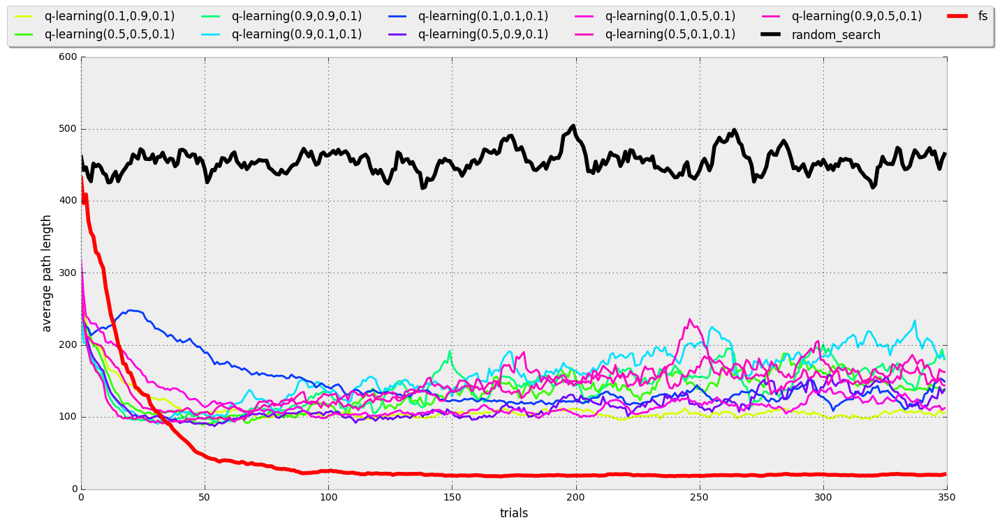

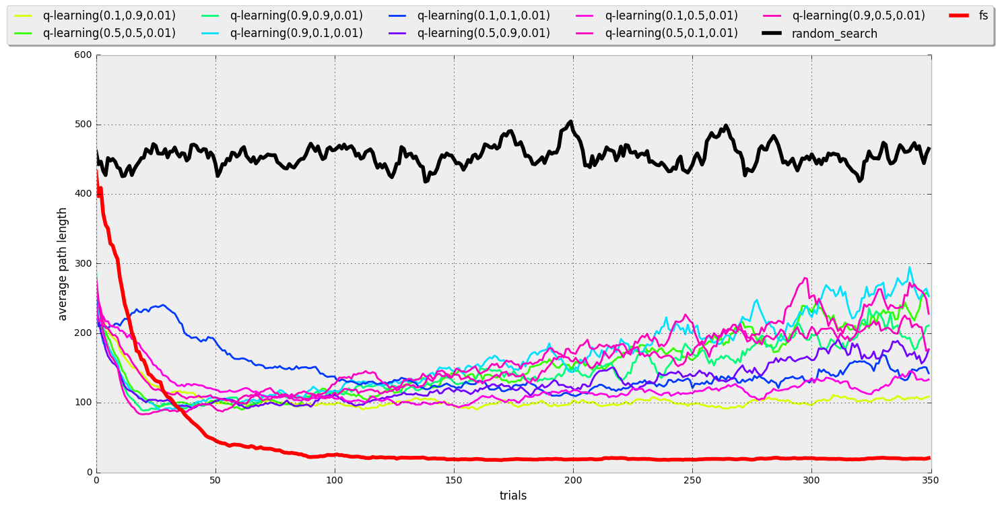

Лучший результат Q-learning показывает с параметрами alpha=0.1, gamma=0.9


In [71]:
vizualize_10x10_rl(env_type="stochasticenvironment", epsilon=0.1, algorithm_name="q-learning")
vizualize_10x10_rl(env_type="stochasticenvironment", epsilon=0.01, algorithm_name="q-learning")
print "Лучший результат Q-learning показывает с параметрами alpha=0.1, gamma=0.9"

### 12. RL для Тора(20x20)

У всех RL алгоритмов alpha=0.1, gamma=0.9 именнно с такими параметами sarsa и q-learning лучше всего показали себя лучше всего на торе 10x10 c розыгрешем доступности ребер между испытаниями([stochasticenvironment](#section11)).

Посчитанные для тора 20x20 версии RL алгоритмов:
* sarsa epsilon=0.01 
* sarsa epsilon=0.1
* sarsa8K epsilon=0.01
* sarsa8K epsilon=0.1
* q-learning epsilon=0.01 
* q-learning epsilon=0.1
* q-learning8K epsilon=0.01
* q-learning8K epsilon=0.1

Stochastic Environment(доступность переходов меняется между испытаниями), Torus20x20
All RL algorithms:


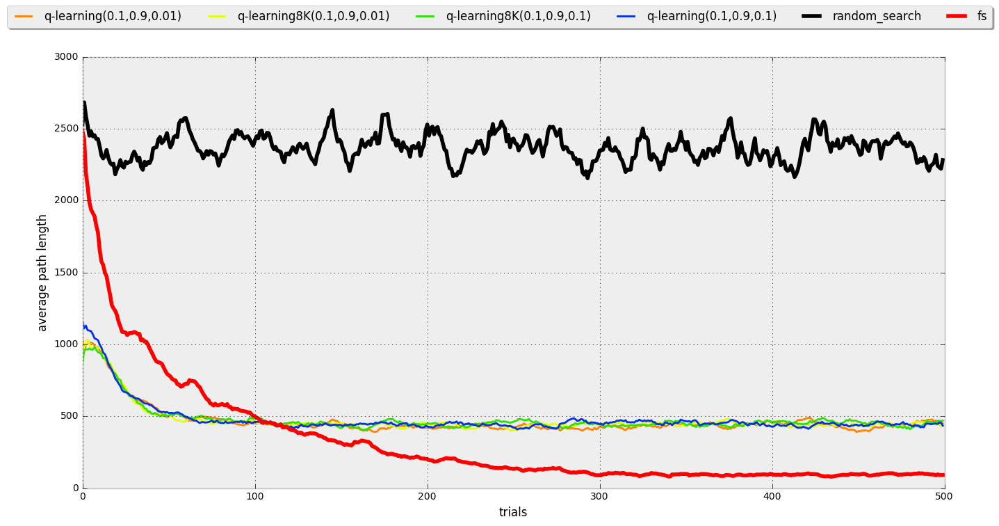

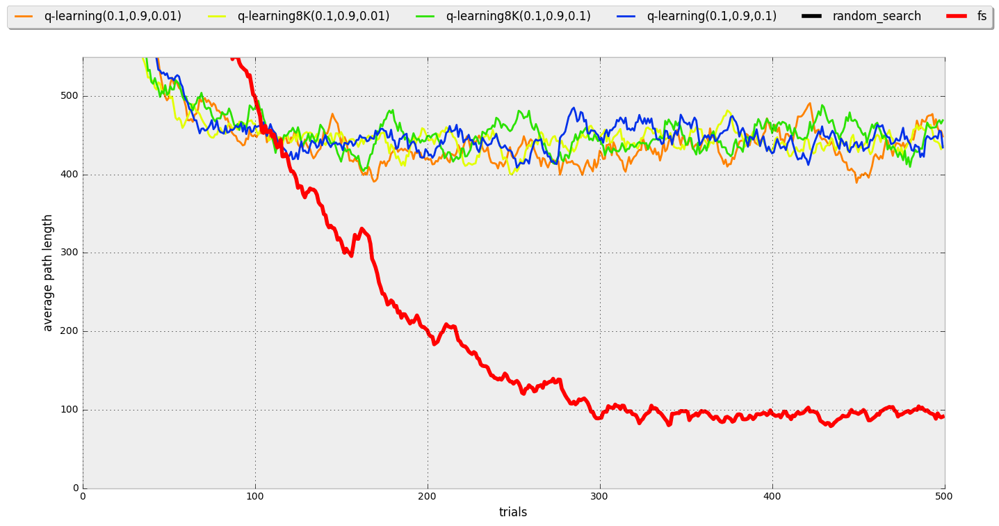

In [72]:
def vizualize_20x20_rl(epsilon_values, alg_names, ylim=None):
    """
    Параметры принимают только определенные значения описанные ниже:
    epsilon_values: доступные значения параметра epsilon: 0.1, 0.01
    alg_names: доступные имена алгоритмов: "sarsa", "q-learning", "sarsa8K", "q-learning8K" 
    """
    rl_algs = {(alg_name, epsilon):[] for alg_name in alg_names for epsilon in epsilon_values} 
    
    random_search = []
    fs_learning = []

    # загружаем результаты испытаний
    folder = join_path(results_dirs, "torus/20x20/stochasticenvironment")
    for i in xrange(1, 11):
        random_search.extend(dr.get_json_data(folder+"/rnd_paths_{0}.json".format(i)))
        fs_learning.extend(dr.get_json_data(folder+"/all_paths_{0}.json".format(i)))
        for alg_name in alg_names:
            for epsilon in epsilon_values:
                #примеры файлов в папке
                #q-learning8K_(0.1,0.9, 0.01)_2  
                #q-learning_(0.1,0.9, 0.1)_4
                #sarsa8K_(0.1,0.9, 0.1)_3
                rl_algs[(alg_name, epsilon)].extend(dr.get_json_data(
                    folder+"/{alg_name}_(0.1,0.9, {0})_{1}.json".format(epsilon, i, alg_name=alg_name)))   
            
    last_n = 10 # усреднение по последним n значениям внутри одного графика(для сглаживания)

    fig = dr.plt.figure(1) 
    ax = fig.add_subplot(111, xlim=(0,500), xlabel='trials', ylabel='average path length') 
    if ylim:
        ax.set_ylim(*ylim)
    h2l = [] # handels to labels for the legend of the plot

    i = 1
    for alg_name, epsilon in rl_algs:
        handle, = ax.plot(aa(rl_algs[(alg_name, epsilon)], last_n), color = dr.plt.cm.prism(i*4))
        h2l.append((handle,"{0}(0.1,0.9,{1})".format(alg_name, epsilon)))
        i+=1
     
    handle, = ax.plot(aa(random_search, last_n), color = "black", lw=4.0) # Результаты случайного поиска 
    h2l.append((handle, "random_search"))
    handle, = ax.plot(aa(fs_learning, last_n), color = "red", lw=4.0) # Результаты алгоритма fs 
    h2l.append((handle, "fs"))    
    

    h, l = zip(*h2l)
    fig.legend(handles=h, labels=l, loc='upper center', shadow=1, ncol=6)
    #dr.plt.title("Environment: {0}".format(env_type))
    dr.plt.show()
print "Stochastic Environment(доступность переходов меняется между испытаниями), Torus20x20"
print "All RL algorithms:"
vizualize_20x20_rl(epsilon_values=[0.1,0.01], alg_names=['q-learning8K', 'q-learning', ])
vizualize_20x20_rl(epsilon_values=[0.1,0.01], alg_names=['q-learning8K', 'q-learning', ], ylim=(0,550))

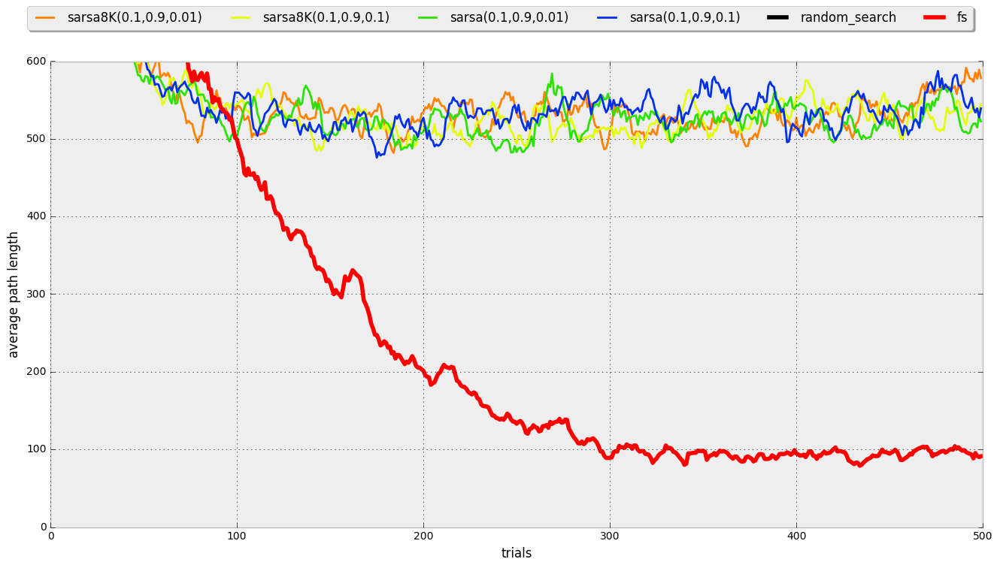

In [73]:
vizualize_20x20_rl(epsilon_values=[0.1,0.01], alg_names=['sarsa', 'sarsa8K'], ylim=(0,600))

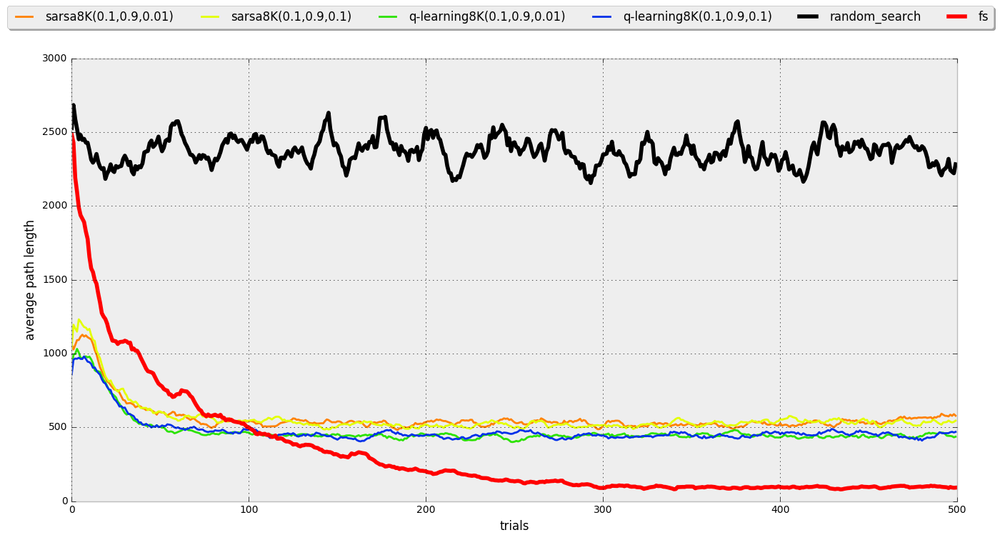

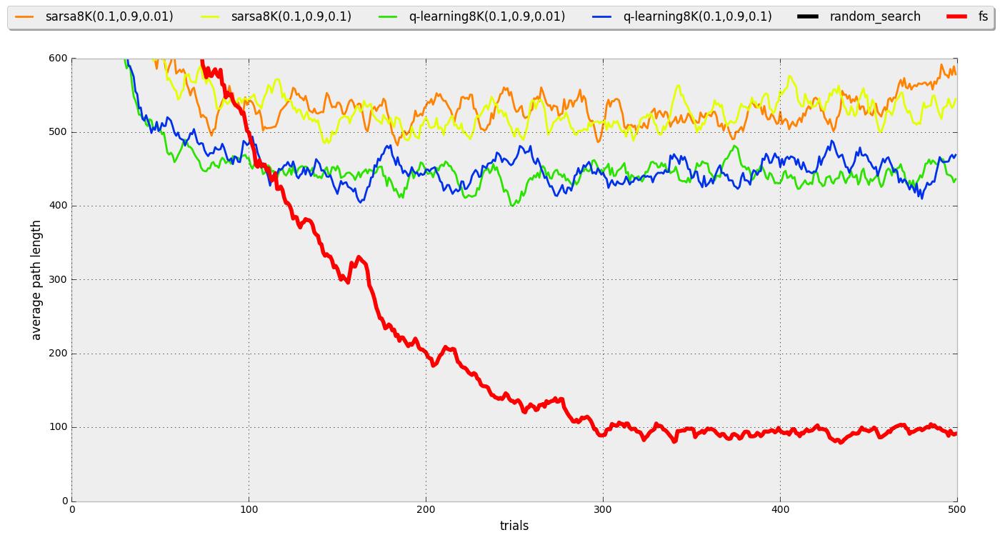

In [74]:
#Поскольку разницы в производительности между 8K и 4K версиями практически нет остановимся на 8K:
vizualize_20x20_rl(epsilon_values=[0.1,0.01], alg_names=['q-learning8K', 'sarsa8K'])
vizualize_20x20_rl(epsilon_values=[0.1,0.01], alg_names=['q-learning8K', 'sarsa8K'], ylim=(0,600))

### 13. Сранение RL и FS в среде с другим типом стохастичности(Тор10x10)

В новой среде доступность ребер разыгрывается каждый раз, когда меняется состояние среды.  

#### SARSA

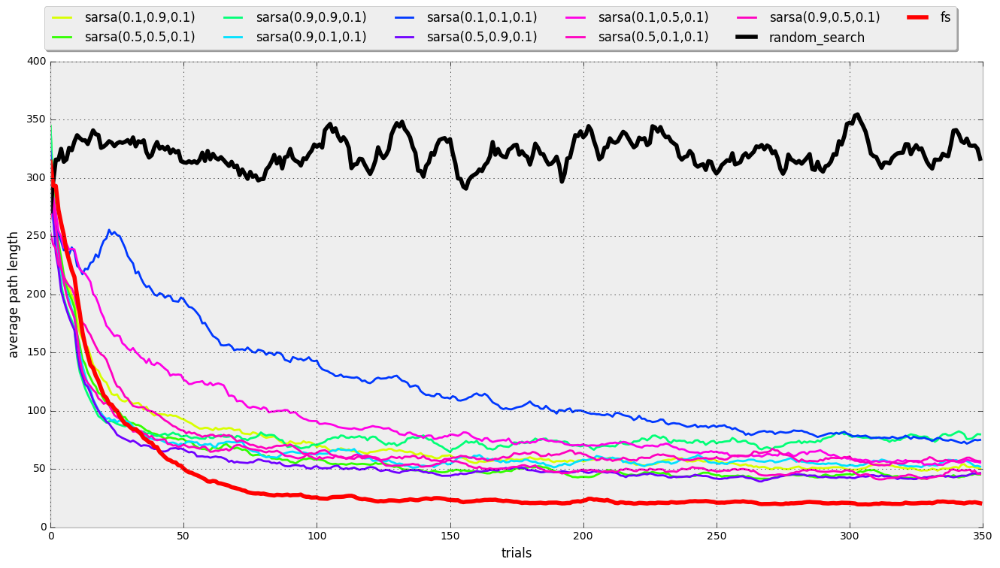

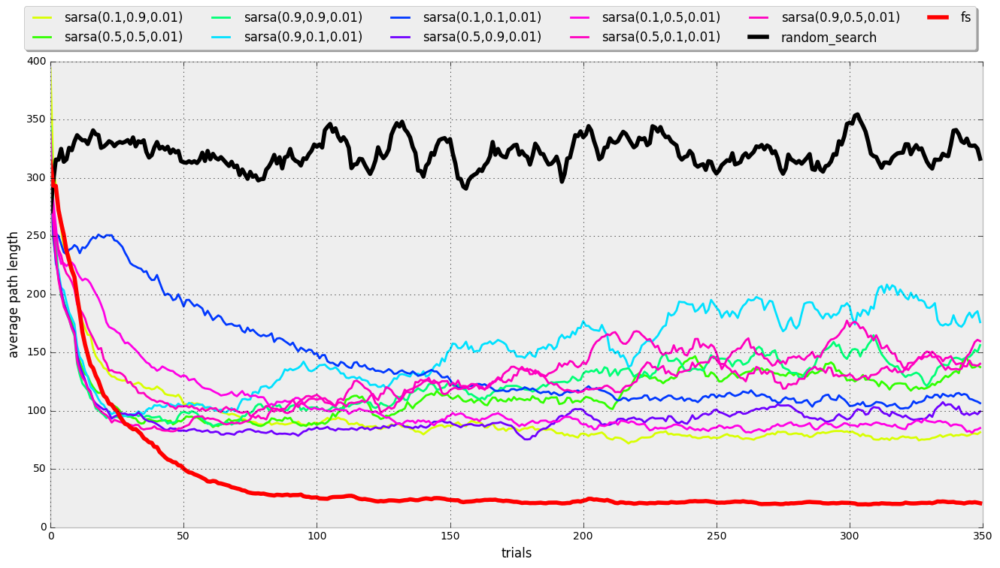

In [75]:
vizualize_10x10_rl(env_type="changestatestochasticityenv", epsilon=0.1, algorithm_name="sarsa")
vizualize_10x10_rl(env_type="changestatestochasticityenv", epsilon=0.01, algorithm_name="sarsa")

#### Q-LEARNING

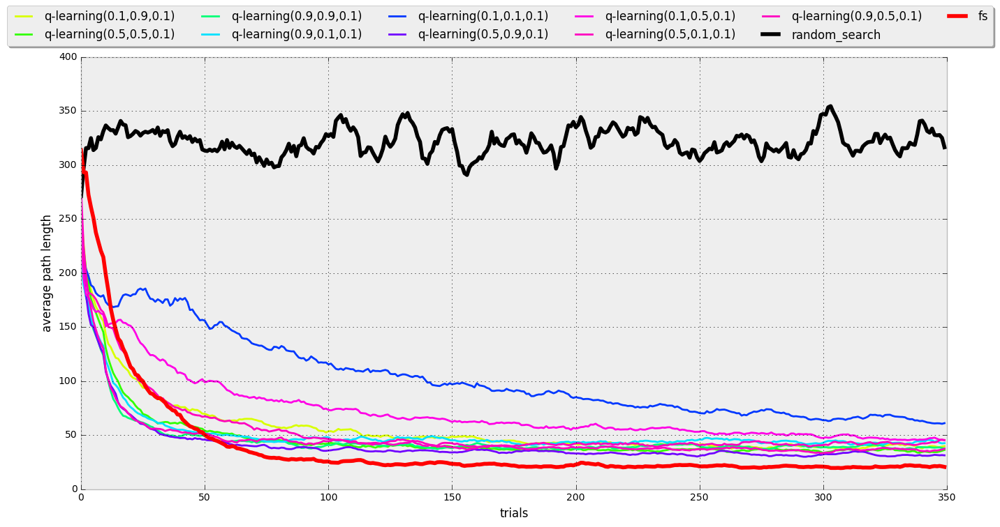

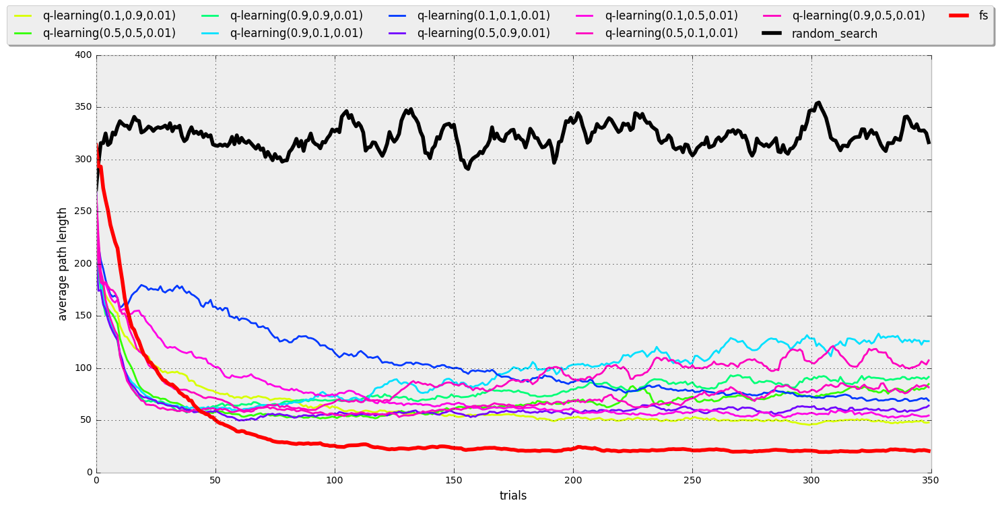

In [76]:
vizualize_10x10_rl(env_type="changestatestochasticityenv", epsilon=0.1, algorithm_name="q-learning")
vizualize_10x10_rl(env_type="changestatestochasticityenv", epsilon=0.01, algorithm_name="q-learning")

### 14. Испытания в задаче макровского процесса принтия решений.

#### 14.1 Сранение RL и FS для марковского процесса принятия решений(Тор10x10)

#### SARSA

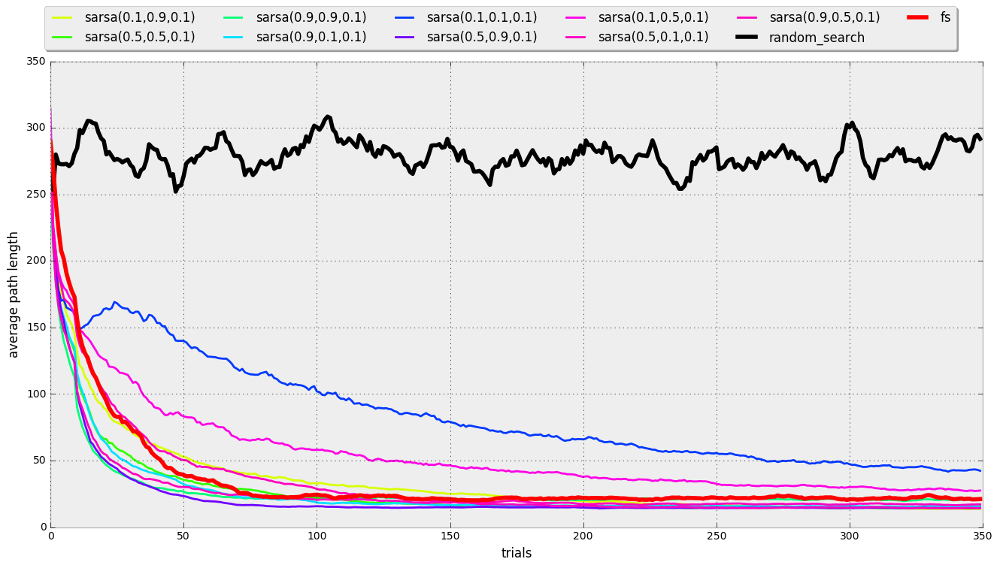

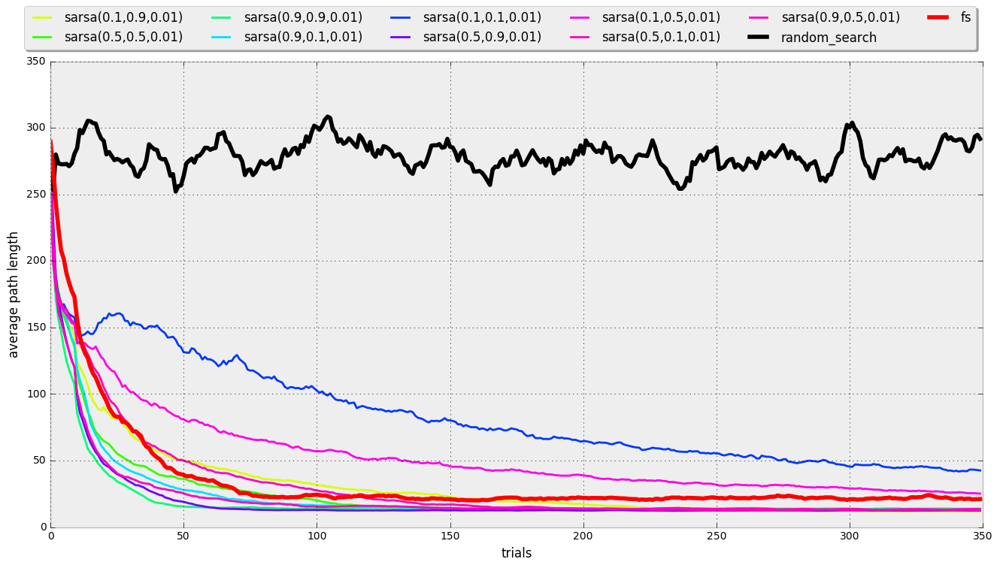

In [77]:
vizualize_10x10_rl(env_type="markovenvironment", epsilon=0.1, algorithm_name="sarsa")
vizualize_10x10_rl(env_type="markovenvironment", epsilon=0.01, algorithm_name="sarsa")

#### Q-LEARNING

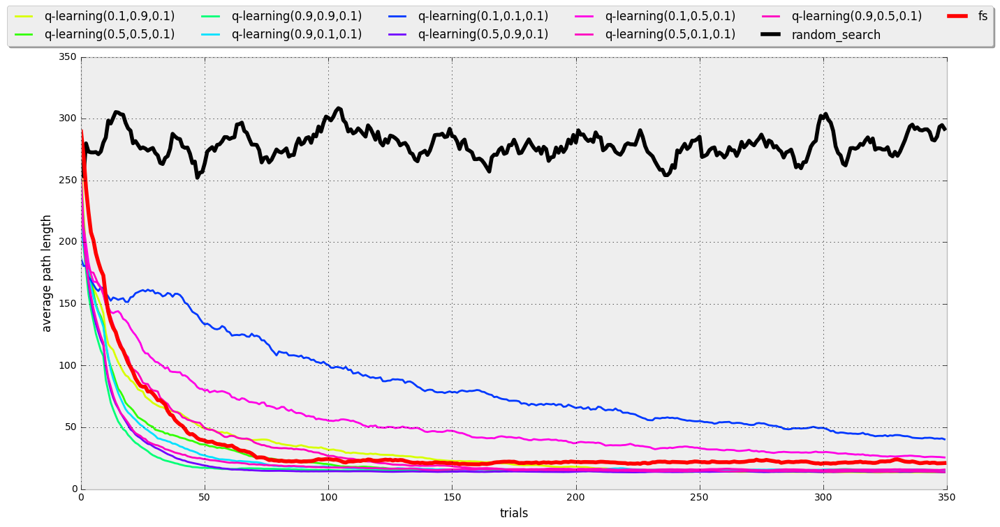

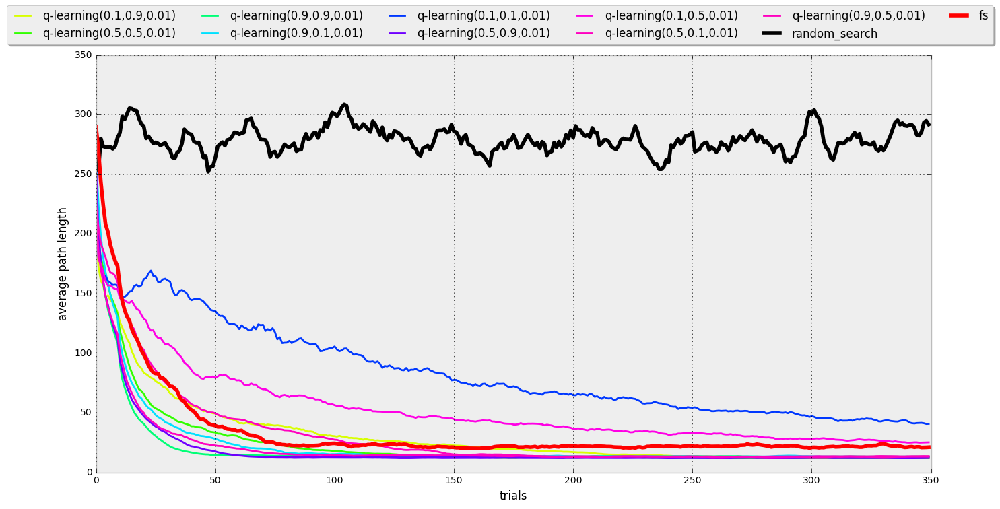

In [78]:
vizualize_10x10_rl(env_type="markovenvironment", epsilon=0.1, algorithm_name="q-learning")
vizualize_10x10_rl(env_type="markovenvironment", epsilon=0.01, algorithm_name="q-learning")

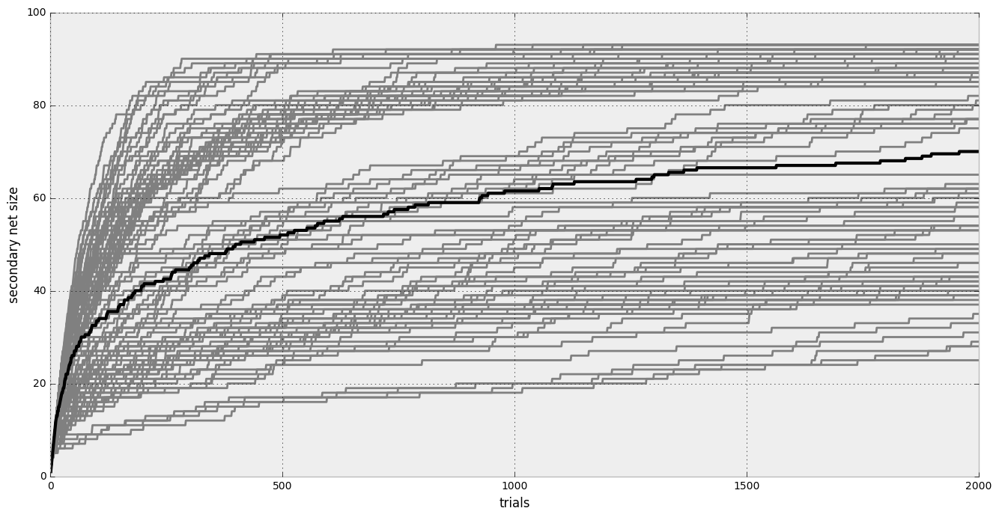

In [79]:
paths5x5_2k = []
nets5x5_2k = []

for i in xrange(1, 11):
    paths5x5_2k.extend(get_data("5x5torus_2000/all_paths_{0}.json".format(i)))
    nets5x5_2k.extend(get_data("5x5torus_2000/all_secondary_{0}.json".format(i)))

dr.black_gray_plot(nets5x5_2k, dr.trials_median(nets5x5_2k), y_label="secondary net size")  

### 15. Сравним производительность одних и тех же алгоритмов в разных средах   

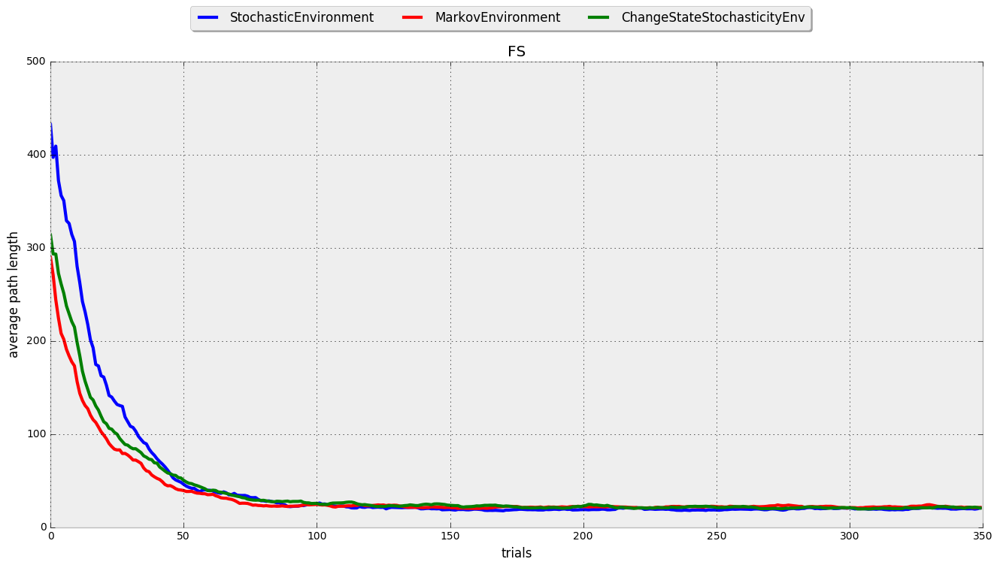

In [80]:
#Все алгоритмы испытывались на одних и тех же 10 графах размерности 10x10
#Среды с различным видом стохастичности также отличались только правилами когда разыгрывалась доступность ребер,
#то есть так же генерировались на основе все тех же 10 графов.
def load_results(path_template, env_type, graph_indices):
    result = []
    for i in graph_indices:
        result.extend(dr.get_json_data(path_template.format(env_type=env_type, graph_number=i)))
    return result   

def vizualize_by_algortihm(file_template, graph_name):
    """
    filetemplate: "folder/{env_type}/algrithm_name_{file_index}.json"
    """
    envs_colors = [("StochasticEnvironment", "blue"),
                   ("MarkovEnvironment", "red"),
                   ("ChangeStateStochasticityEnv","green")]
    
    indices = range(1,11)
    last_n = 10 # усреднение по последним n значениям внутри одного графика(для сглаживания)

    fig = dr.plt.figure(1) 
    ax = fig.add_subplot(111, xlim=(0,350), ylim=(0,500),  xlabel='trials', ylabel='average path length')        
    h2l = [] # handels to labels for the legend of the plot
    
    for env, color in envs_colors:
        result = load_results(file_template, env.lower(), indices)
        handle, = ax.plot(aa(result, last_n), color=color, lw=3.0)                
        h2l.append((handle, env))
        
    h, l = zip(*h2l)
    fig.legend(handles=h, labels=l, loc='upper center', shadow=1, ncol=6) 
    dr.plt.title(graph_name)
    dr.plt.savefig(graph_name + ".png")
    dr.plt.show()

file_template = join_path(results_dirs, "torus/10x10_other/{env_type}/all_paths_{graph_number}.json")      
vizualize_by_algortihm(file_template, "FS")   

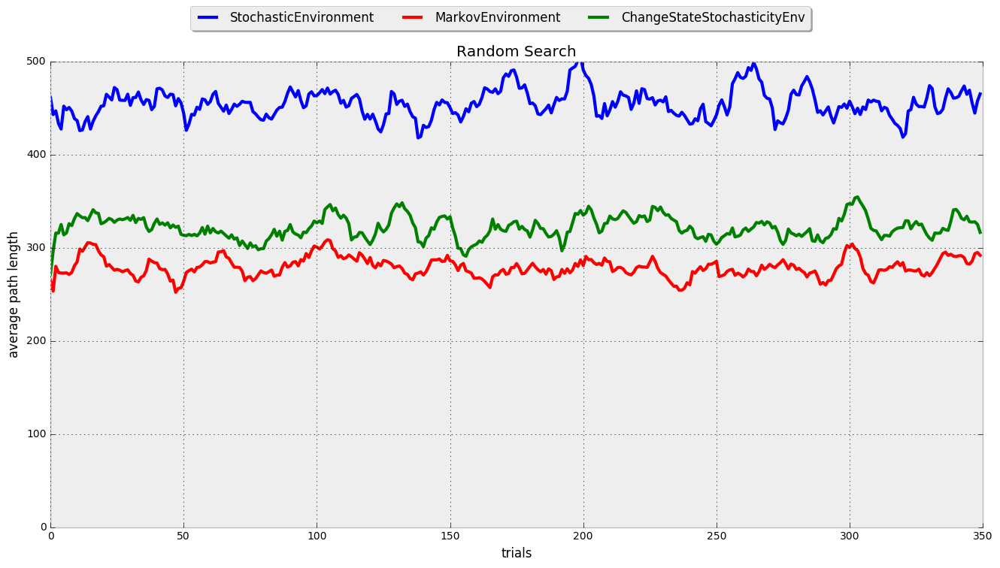

In [81]:
# С одной стороны странно, что значения для случайного поиска различаются в разных средах,
# но начальные значения(график выше) алгоритма FS так же различаются, а он по началу пользуется по сути именно
# случайным поиском(который реализуется косвенно при отсутствии вторичных ФС), значит это не ошибка в реализации 
# данного алгоритма случайного поиска
file_template = join_path(results_dirs, "torus/10x10_other/{env_type}/rnd_paths_{graph_number}.json")
vizualize_by_algortihm(file_template, "Random Search") 

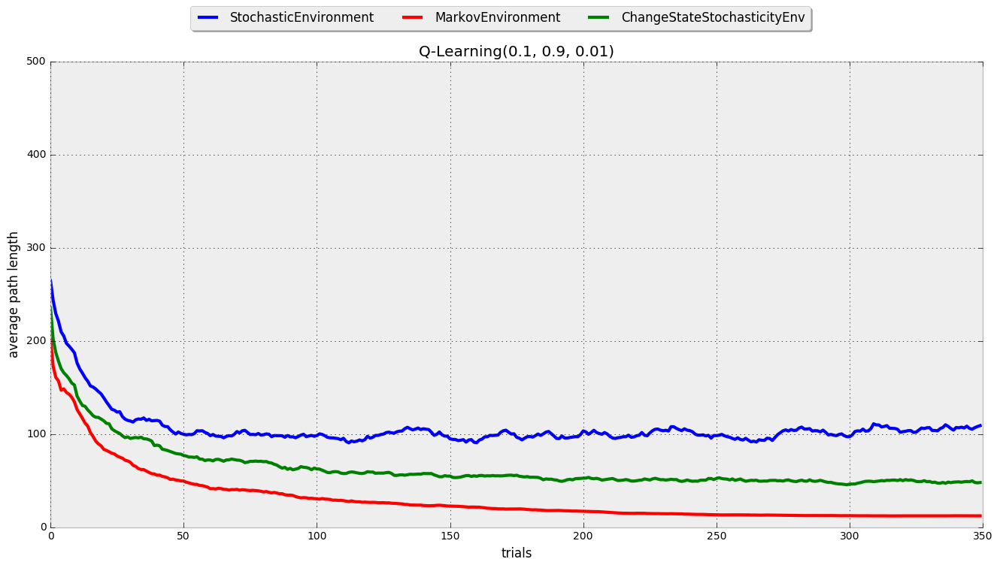

In [83]:
file_template = join_path(results_dirs,
                          "torus/10x10_td_compare/{env_type}/q-learning_(0.1,0.9, 0.01)_{graph_number}.json")
vizualize_by_algortihm(file_template, "Q-Learning(0.1, 0.9, 0.01)")

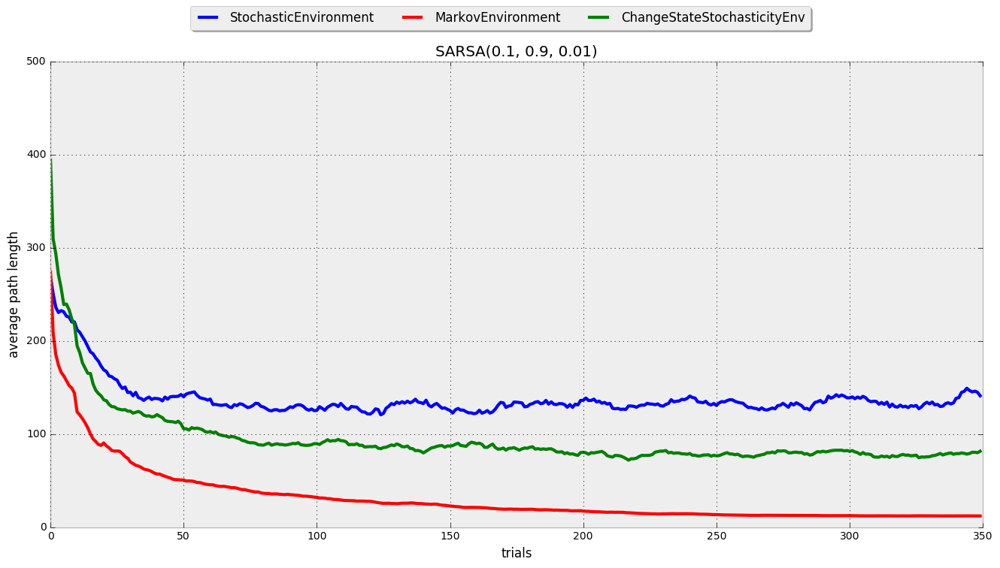

In [84]:
file_template = join_path(results_dirs,
                          "torus/10x10_td_compare/{env_type}/sarsa_(0.1,0.9, 0.01)_{graph_number}.json")
vizualize_by_algortihm(file_template, "SARSA(0.1, 0.9, 0.01)")   